# Importing modules

In [124]:
# Plots

# Matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import matplotlib.patches as mpatches
from matplotlib.ticker import FormatStrFormatter

import seaborn as sns

from scipy.cluster import hierarchy

import pandas as pd
import numpy as np

#for cross validation
from sklearn.model_selection import *

#for scaling
from sklearn.preprocessing import *

#metrics for evaluation of performance
from sklearn.metrics import *

#classifiers
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

#   Creating a data-frame of the initial data-set samples details which will be used later

In [16]:
f = open('names.txt', 'r')
names = []
for line in f:
    names.append(line[:-1])
f.close()

nc = []
for i in names:
    a = i.replace(' ', '')
    nc.append(a)
    
gr = []
for i in names:
    print(i)
    if 'papio cynocephalus' in i:
        gr.append('papio cynocephalus')
    elif 'mandrillus leucophaeus' in i:
        gr.append('mandrillus leucophaeus')
    elif 'Macaca mulatta' in i:
        gr.append('Macaca mulatta')    
    elif 'lophocebus albigena' in i:
        gr.append('lophocebus albigena')
    elif 'lophocebus aterrimus' in i:  
        gr.append('lophocebus aterrimus')
    else:
        gr.append('Cercocebus torquatus')
        
df = pd.DataFrame()
df['group'] = gr
#print(gr)

f = open('sex.txt', 'r')
sex = []
for line in f:
    sex.append(line[:-1])
f.close()

encoder = LabelEncoder()
y = encoder.fit_transform(df.iloc[:, 0])

print(len(df.iloc[:, 0]), len(sex))

df['encoded'] = y

df['sex'] = sex

df ['complete'] = nc

df.to_excel('data_labels.xlsx')

df.head()

papio cynocephalus  66.491
papio cynocephalus  61.778
papio cynocephalus  61.735
papio cynocephalus  61.737
papio cynocephalus  61.768
papio cynocephalus  61.764
papio cynocephalus  61.762
papio cynocephalus  61.775
papio cynocephalus  61.742
mandrillus leucophaeus 1959.1.2.6
mandrillus leucophaeus 12.10.28.63
mandrillus leucophaeus 49.82
mandrillus leucophaeus 1974.225
mandrillus leucophaeus 12.10.28.61
mandrillus leucophaeus 12.10.28.65
mandrillus leucophaeus 1974.203
mandrillus leucophaeus 12.10.28.64
mandrillus leucophaeus 1974.201
mandrillus leucophaeus 12.10.28.62
mandrillus leucophaeus 12.10.28.59
mandrillus leucophaeus 12.10.28.67
mandrillus leucophaeus 12.10.28.60
mandrillus leucophaeus 1974.199
mandrillus leucophaeus 66.6356
mandrillus leucophaeus 67.1711
mandrillus leucophaeus 49.89
mandrillus leucophaeus 1974.228
mandrillus leucophaeus 49.85
mandrillus leucophaeus 48.444
Macaca mulatta f80.246
Macaca mulatta m ?sex1989.309
Macaca mulatta m31.1.11.22
Macaca mulatta m50.372
M

,group,encoded,sex,complete
0,papio cynocephalus,5,Male,papiocynocephalus66.491
1,papio cynocephalus,5,Female,papiocynocephalus61.778
2,papio cynocephalus,5,Male,papiocynocephalus61.735
3,papio cynocephalus,5,Female,papiocynocephalus61.737
4,papio cynocephalus,5,Female,papiocynocephalus61.768


In [17]:
df.shape

(95, 4)

# The main class

In [18]:
from Morphometrics_2 import procpca as procpca

In [19]:
prpca = procpca(df, nn=2)

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

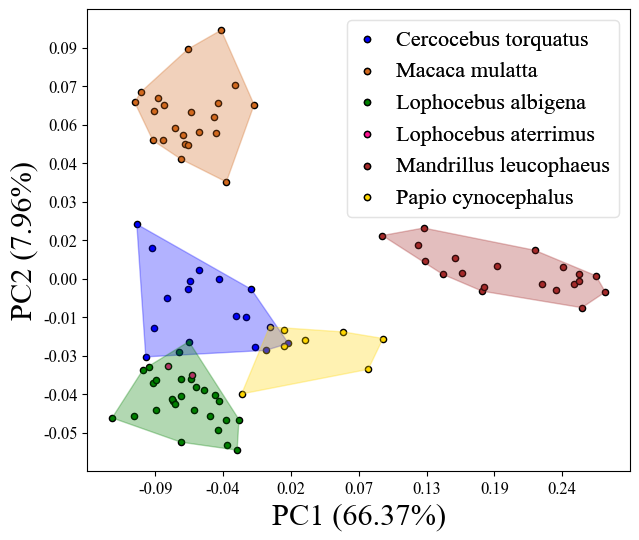

In [20]:
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('PCA_all.txt')
#prpca.post_process(deletg='corocebus torquatus')
#prpca.plot_tsne(n_r=4, decision_boundary = False, cv = True, dlegend = True, index_r = 0, perplexity=40, n_neighbors=6, annote = True)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, index_r = 0, dlegend = True, annote = False, legend_font_s= 16)
plt.savefig('test.svg', transparent = True, bbox_inches='tight')
plt.show()

In [21]:
prpca.varex

array([6.63691463e+01, 7.96228043e+00, 4.35624617e+00, 3.28276575e+00,
       1.90893228e+00, 1.57565961e+00, 1.52111129e+00, 1.20901348e+00,
       1.05465387e+00, 7.91443149e-01, 7.33887294e-01, 6.30940564e-01,
       5.73141207e-01, 5.30968824e-01, 4.88190540e-01, 4.60150192e-01,
       4.10124600e-01, 4.09391022e-01, 3.78290161e-01, 3.45471797e-01,
       3.18273574e-01, 2.92692759e-01, 2.87293699e-01, 2.65814476e-01,
       2.46285420e-01, 2.32888280e-01, 2.16496562e-01, 2.06719824e-01,
       2.04297280e-01, 1.77932286e-01, 1.67950702e-01, 1.56049994e-01,
       1.53775833e-01, 1.40426044e-01, 1.29390804e-01, 1.26624564e-01,
       1.18413927e-01, 1.17716168e-01, 1.02323421e-01, 1.00233348e-01,
       9.18954665e-02, 8.36328070e-02, 8.01685300e-02, 7.78164940e-02,
       6.83496162e-02, 6.57714204e-02, 5.95859571e-02, 5.89234758e-02,
       5.70432707e-02, 4.98239661e-02, 4.69156576e-02, 4.65015823e-02,
       4.07162151e-02, 3.65852228e-02, 3.27565290e-02, 3.24461541e-02,
      

lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


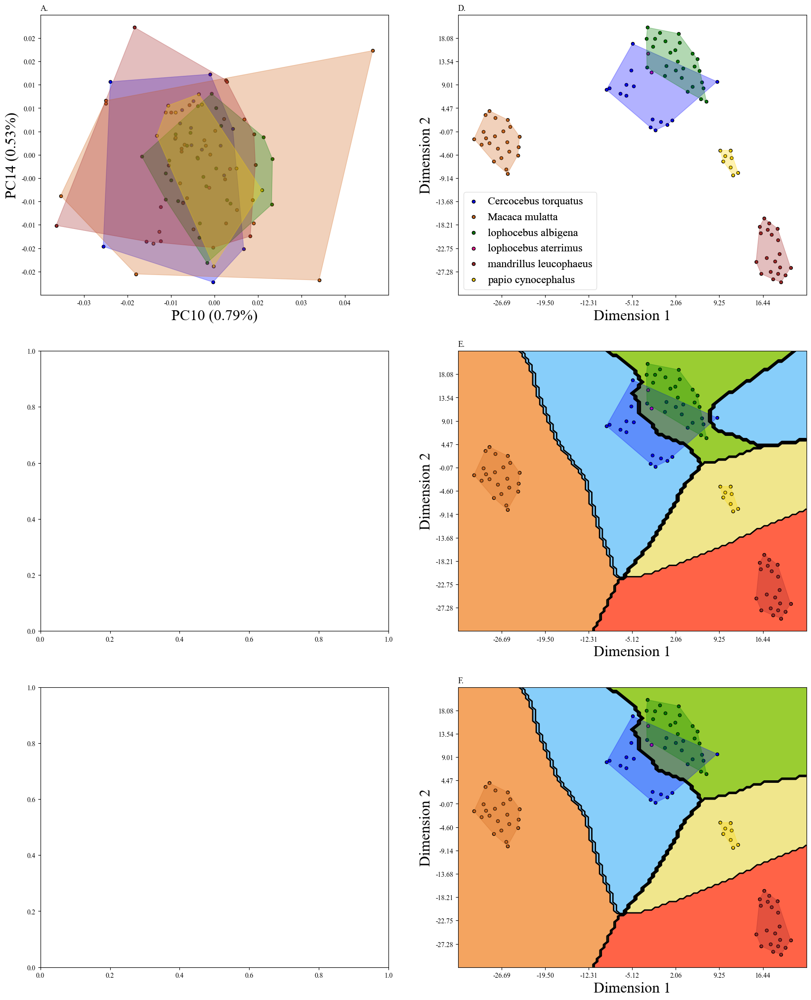

In [8]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=10, ind2=14, ax = fig_axes[0,0], index_r = 0, dlegend = False, annote = False)
fig_axes[0,0].set_title('A.', fontsize = 12, loc = 'left')


prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
fig_axes[0,1].set_title('D.', fontsize = 12, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = False, ax = fig_axes[1,1], n_r = 4, index_r = 0, perplexity=10)
fig_axes[1,1].set_title('E.', fontsize = 12, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=10)
fig_axes[2,1].set_title('F.', fontsize = 12, loc = 'left')



plt.savefig('all_10_14.svg', transparent = True)
plt.show()

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

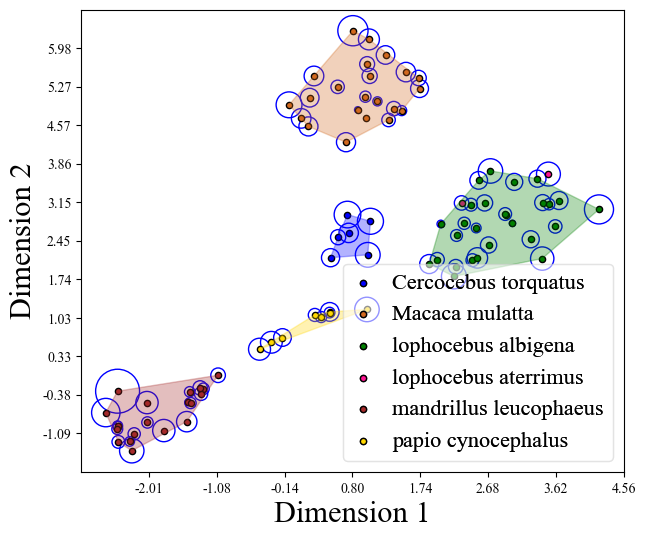

In [9]:
# An example of reading the results and ploting the first 3 principal components
prpca = procpca(df)
dataf, datag, ind, name= prpca.read('without_cercocebus_torquatus_84,85,86,87,90,92_remains.txt')
prpca.plot_tsne(n_r=3, decision_boundary = False, method = 'lof', cv = True, dlegend = True, index_r = 0, perplexity=40, n_neighbors=6)
plt.show()
#prpca.post_process(deletg='Lophocebus albigena')

In [10]:
prpca.removed

'0,80,81,82,83,88,89,91,93,94'

# Classifier Evaluation

In [10]:
Xs = prpca.GPApt
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg

In [11]:
deletg

In [12]:
prpca.ys.shape

(83,)

In [13]:
encoder = LabelEncoder()

In [14]:
encoder.fit(ys)

LabelEncoder()

In [15]:
encoder.transform(ys)

array([4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0], dtype=int64)

In [16]:
len(np.unique(ys))

5

In [17]:
prpca.encoder.classes_

array(['Cercocebus torquatus', 'Macaca mulatta', 'lophocebus albigena',
       'lophocebus aterrimus', 'mandrillus leucophaeus',
       'papio cynocephalus'], dtype=object)

In [18]:
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis

In [19]:
x_axis_labels

['Cercocebus torquatus',
 'Macaca mulatta',
 'lophocebus albigena',
 'lophocebus aterrimus',
 'mandrillus leucophaeus',
 'papio cynocephalus']

In [20]:
y0

array(['papio cynocephalus', 'papio cynocephalus', 'papio cynocephalus',
       'papio cynocephalus', 'papio cynocephalus', 'papio cynocephalus',
       'papio cynocephalus', 'papio cynocephalus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'mandrillus leucophaeus', 'mandrillus leucophaeus',
       'Macaca mulatta', 'Macaca mulatta', 'Macaca mulatta',
       'Macaca mulatta', 'Macaca mulatta', 'Macaca mulatta',
       'Macaca mulatta', 'Macaca mulatta', 'Macaca mulatta',
       'Macaca mulatta', 'Maca

In [21]:
def evalc(clf):

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []
    yp = []

    for train, test in cv.split(Xs, y):

        mask = np.ones(len(y[train]), dtype = bool)
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False

        clf.fit(Xs[train][mask], encoder.transform(y[train][mask]))

        mask = np.ones(len(y[test]), dtype = bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False

        pred = encoder.inverse_transform(clf.predict(Xs[test][mask]))

        yt.append(y[test][mask])
        yp.append(pred)
        #print(np.unique(pred), np.unique(y[test][mask]))

    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    sns.heatmap(confusion_matrix(yt, yp), annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

    #print(yt, yp)
    #print(prpca.encoder.inverse_transform(np.unique(yt)))
    
    return(yt, yp, x_axis_labels)

In [22]:
from xgboost import XGBClassifier

In [23]:
model = XGBClassifier(max_depth = 3, n_estimators = 20)

In [24]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)

In [50]:
deletg = prpca.deletg

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


(array([5, 1, 1, 2, 2, 0, 5, 1, 1, 2, 2, 0, 5, 1, 2, 2, 2, 0, 1, 1, 2, 2,
        0, 1, 1, 2, 2, 0]),
 array([0, 0, 0, 0, 2, 0, 2, 1, 1, 2, 2, 0, 2, 1, 2, 2, 2, 2, 1, 1, 2, 5,
        0, 1, 1, 2, 1, 1]),
 array(['Cercocebus torquatus', 'Macaca mulatta', 'lophocebus albigena',
        'papio cynocephalus'], dtype=object))

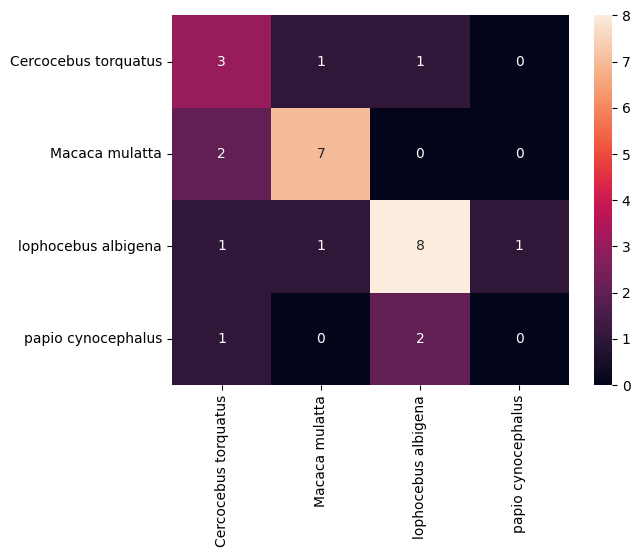

In [51]:
evalc(model)

In [52]:
GS = GridSearchCV(estimator=model,
             param_grid={'n_estimators': [10, 20, 50, 100, 200], 'max_depth': [3, 4, 5, 6, 7, 8, 9, 10]}, scoring= 'accuracy', cv = cv)

In [53]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=72, shuffle=True),
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     callbacks=None, colsample_bylevel=1,
                                     colsample_bynode=1, colsample_bytree=1,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=0, gpu_id=-1,
                                     grow_policy='depthwise',
                                     importance_type=None,
                                     interaction_cons...
                                     learning_rate=0.300000012, max_bin=256,
                                     max_cat_to_onehot=4, max_delta_step=0,
                                     max_depth=3, max_leaves=0,
                                     min_child_weight=1, missing=nan,
                                     monotone_constraints='()', n_estimators=20,
                                     n_jobs=0, num_parallel_tree=1,
                                     objective='multi:softprob',
                                     predictor='auto', random_state=0,
                                     reg_alpha=0, ...),
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
                         'n_estimators': [10, 20, 50, 100, 200]},
             scoring='accuracy')

In [54]:
GS.best_params_

{'max_depth': 3, 'n_estimators': 50}

In [55]:
model = XGBClassifier(max_depth = 3, n_estimators = 10)

In [10]:
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

In [57]:
model = LogisticRegression(max_iter=10000)

In [58]:
# Searching for hyper parameters (best max_depth)
GS = GridSearchCV(estimator=model,
             param_grid={'penalty': ['l1', 'l2'],
                         'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'solver': ['liblinear', 'saga']
                        }, scoring= 'accuracy')

In [59]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(estimator=LogisticRegression(max_iter=10000),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100],
                         'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'saga']},
             scoring='accuracy')

In [60]:
GS.best_params_

{'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}

In [61]:
model = LogisticRegression(C= 100, penalty= 'l1', solver= 'liblinear')

In [11]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

In [63]:
model = RandomForestClassifier()

In [64]:
GS = GridSearchCV(estimator=model,
             param_grid={'n_estimators': [10, 20, 50, 100, 200], 'max_depth': [3, 4, 5, 6, 7, 8, 9, 10]}, scoring= 'accuracy', cv = cv)

In [65]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=72, shuffle=True),
             estimator=RandomForestClassifier(),
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
                         'n_estimators': [10, 20, 50, 100, 200]},
             scoring='accuracy')

In [66]:
GS.best_params_

{'max_depth': 4, 'n_estimators': 20}

In [67]:
model = RandomForestClassifier(max_depth = 5, n_estimators = 50)

In [12]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

In [69]:
model = ExtraTreesClassifier()

In [70]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=72, shuffle=True),
             estimator=RandomForestClassifier(),
             param_grid={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
                         'n_estimators': [10, 20, 50, 100, 200]},
             scoring='accuracy')

In [71]:
GS.best_params_

{'max_depth': 6, 'n_estimators': 10}

In [72]:
model = ExtraTreesClassifier(max_depth = 5, n_estimators = 10)

In [12]:
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

In [13]:
kernel = 1.0 * RBF(1.0)
model = GaussianProcessClassifier(kernel=kernel, random_state=0)

In [11]:
evalc(model)

NameError: name 'Xs' is not defined

In [12]:
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

In [77]:
model = SVC(gamma = 'auto')

In [78]:
# Searching for hyper parameters (best max_depth)
GS = GridSearchCV(estimator=model,
             param_grid={'kernel': ['linear','poly', 'rbf', 'sigmoid'], 'C' : [0.01, 0.1, 1, 10, 100]}, scoring= 'accuracy')

In [79]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(estimator=SVC(gamma='auto'),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='accuracy')

In [80]:
GS.best_params_

{'C': 100, 'kernel': 'linear'}

In [81]:
model = SVC(gamma = 'auto', C = 100, kernel='linear')

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


(array([5, 1, 1, 2, 2, 0, 5, 1, 1, 2, 2, 0, 5, 1, 2, 2, 2, 0, 1, 1, 2, 2,
        0, 1, 1, 2, 2, 0]),
 array([2, 0, 0, 2, 2, 0, 2, 1, 1, 2, 2, 0, 2, 1, 2, 2, 2, 2, 1, 1, 2, 2,
        2, 1, 1, 2, 0, 1]),
 array(['Cercocebus torquatus', 'Macaca mulatta', 'lophocebus albigena',
        'papio cynocephalus'], dtype=object))

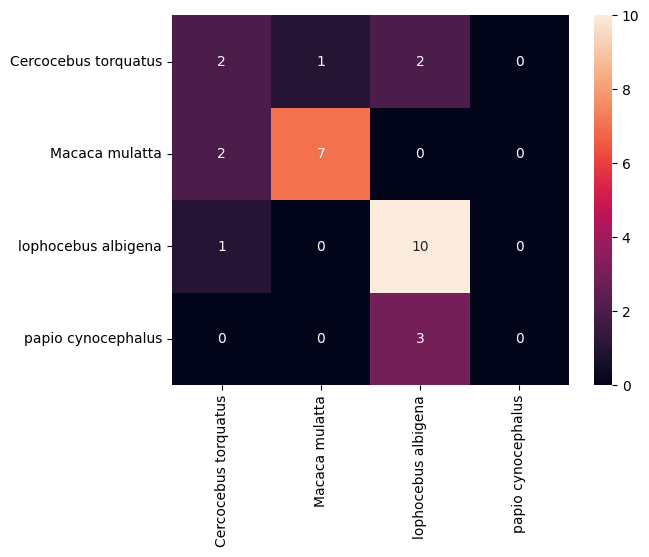

In [82]:
evalc(model)

In [32]:
from sklearn.neighbors import KNeighborsClassifier

In [33]:
model = KNeighborsClassifier()

In [34]:
# Searching for hyper parameters (best max_depth)
GS = GridSearchCV(estimator=model,
             param_grid={'n_neighbors': [1, 2, 3, 4, 5]}, scoring= 'accuracy')

In [35]:
GS.fit(prpca.Xr, encoder.transform(ys))

c:\Users\edria\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
c:\Users\edria\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:211: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [1, 2, 3, 4, 5]}, scoring='accuracy')

In [36]:
GS.best_params_

{'n_neighbors': 2}

# CM plots

In [7]:
Xs = prpca.GPApt
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg

In [8]:
len(np.where(y0 == 'lophocebus albigena')[0])

27

In [9]:
deletg

In [10]:
prpca.ys

array([5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0])

In [11]:
encoder = LabelEncoder()

In [12]:
encoder.fit(ys)

LabelEncoder()

In [13]:
encoder.transform(ys)

array([4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0], dtype=int64)

In [14]:
len(np.unique(ys))

5

In [15]:
prpca.encoder.classes_

array(['Cercocebus torquatus', 'Macaca mulatta', 'lophocebus albigena',
       'lophocebus aterrimus', 'mandrillus leucophaeus',
       'papio cynocephalus'], dtype=object)

In [16]:
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis

In [17]:
x_axis_labels

['Cercocebus torquatus',
 'Macaca mulatta',
 'lophocebus albigena',
 'lophocebus aterrimus',
 'mandrillus leucophaeus',
 'papio cynocephalus']

In [18]:
model = KNeighborsClassifier(n_neighbors=2)

In [290]:
def evalc(clf):

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []
    yp = []

    for train, test in cv.split(Xs, y):

        mask = np.ones(len(y[train]), dtype = bool)
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False

        clf.fit(Xs[train][mask], encoder.transform(y[train][mask]))

        mask = np.ones(len(y[test]), dtype = bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False

        print(clf.predict(Xs[test][mask]))
        pred = encoder.inverse_transform(clf.predict(Xs[test][mask]))

        yt.append(y[test][mask])
        yp.append(pred)
        #print(np.unique(pred), np.unique(y[test][mask]))

    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    print(len(yt), len(yp))

    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    sns.heatmap(confusion_matrix(yt, yp), annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

    #print(yt, yp)
    #print(prpca.encoder.inverse_transform(np.unique(yt)))
    
    return(yt, yp, x_axis_labels)

def eval():
    KNNc =  KNeighborsClassifier(n_neighbors=2)
    LRc = LogisticRegression(C= 100, penalty= 'l1', solver= 'saga')
    kernel = 1.0 * RBF(1.0)
    model = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPc = GaussianProcessClassifier(kernel=kernel, random_state=0)
    SVc = SVC(gamma = 'auto', C = 100, kernel='linear')
    RFc = RandomForestClassifier(max_depth = 5, n_estimators = 50)
    ETc = ExtraTreesClassifier(max_depth = 9, n_estimators = 100)
    XGBc = XGBClassifier(max_depth = 3, n_estimators = 50)
    models = [KNNc, LRc, GPc, SVc, RFc, ETc, XGBc]

    yt = []
    yp = []
    xl = []
    for i in models:
        ytt, ypt, x_axis_labels = evalc(i)
        yt.append(ytt)
        yp.append(ypt)
        xl.append(x_axis_labels)

    print(i, accuracy_score(ytt, ypt), balanced_accuracy_score(ytt, ypt))

    return yt, yp, xl

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 2]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
92 92
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[2 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 2]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 2]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 2]
92 92


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarnin

[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 2]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
92 92
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 2]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 2]
92 92


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 2 0]
[3 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 2 2]
92 92


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 2 0]
[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 2 2 2]
92 92


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[4 4 3 3 3 3 1 1 1 1 2 2 2 2 2 2 0 0 0]
[0 4 3 3 3 1 1 1 1 1 2 2 2 2 2 2 0 2 0]
[3 4 3 3 3 3 1 1 1 1 2 2 2 2 2 1 0 0]
[2 3 3 3 3 1 1 1 1 1 2 0 2 2 2 0 0 0]
[4 3 3 3 3 1 1 1 1 1 2 2 2 2 2 0 2 2]
92 92
XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=50, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, ...) 0.9021739130434783 0.8542592592592593


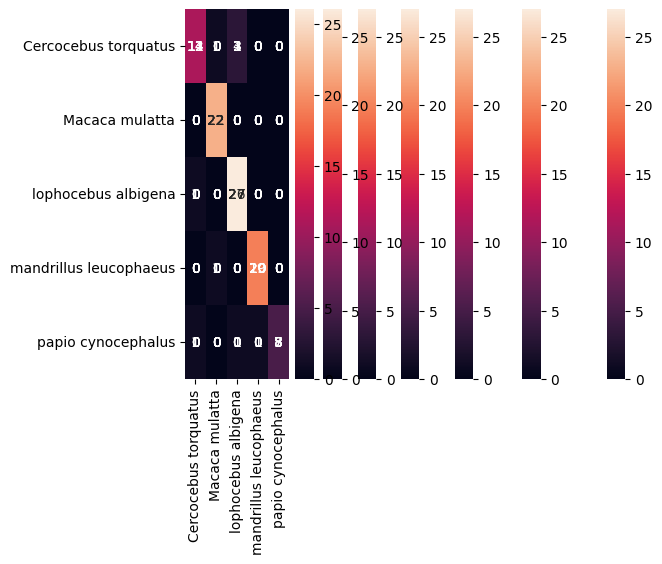

In [20]:
yt, yp, xl = eval()

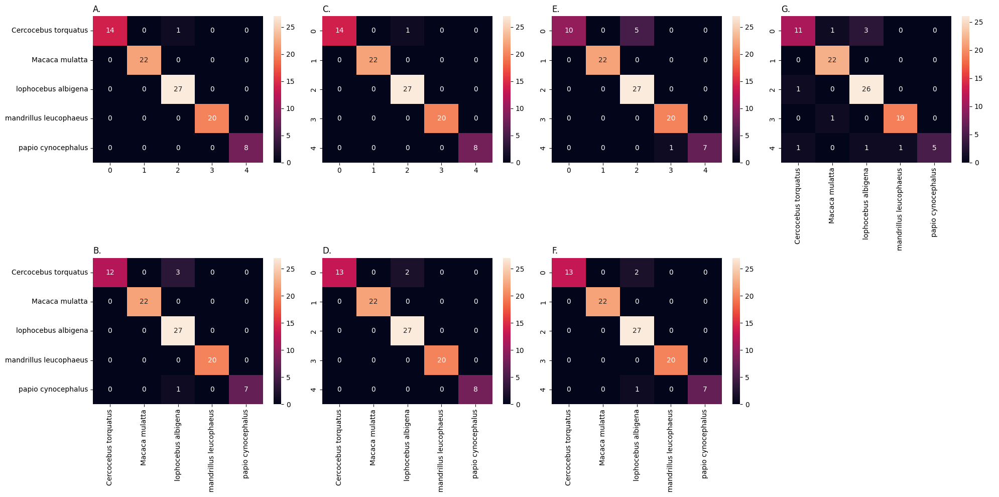

In [22]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=4, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0])
fig_axes[0,0].set_title('A.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1])
fig_axes[1,0].set_title('B.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True)
fig_axes[0,1].set_title('C.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3])
fig_axes[1,1].set_title('D.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True)
fig_axes[0,2].set_title('E.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5])
fig_axes[1,2].set_title('F.', fontsize = 12, loc = 'left')
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6])
fig_axes[0,3].set_title('G.', fontsize = 12, loc = 'left')
fig_axes[1,3].axis('off')

fig.tight_layout()
plt.savefig('CM_without macaca mulatta.svg', transparent = True, bbox_inches = "tight")
plt.show()

# Outlier Detection Local Outlier Factor

In [40]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [41]:
Xs0 = prpca0.GPApt
y0 = prpca0.y
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y
Xs4 = prpca4.GPApt
y4 = prpca4.y
Xs5 = prpca5.GPApt
y5 = prpca5.y
Xs6 = prpca6.GPApt
y6 = prpca6.y
Xs7 = prpca7.GPApt
y7 = prpca7.y
Xs8 = prpca8.GPApt
y8 = prpca8.y
Xs9 = prpca9.GPApt
y9 = prpca9.y
Xs10 = prpca10.GPApt
y10 = prpca10.y
Xs11 = prpca11.GPApt
y11 = prpca11.y
Xs12 = prpca12.GPApt
y12 = prpca12.y
Xs13 = prpca13.GPApt
y13 = prpca13.y
Xs14 = prpca14.GPApt
y14 = prpca14.y

In [42]:
from sklearn.neighbors import LocalOutlierFactor
model = LocalOutlierFactor(n_neighbors=5, contamination='auto')

In [43]:
y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.negative_outlier_factor_
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.negative_outlier_factor_
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.negative_outlier_factor_
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.negative_outlier_factor_
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.negative_outlier_factor_
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.negative_outlier_factor_
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.negative_outlier_factor_
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.negative_outlier_factor_
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.negative_outlier_factor_
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.negative_outlier_factor_
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.negative_outlier_factor_
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.negative_outlier_factor_
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.negative_outlier_factor_
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.negative_outlier_factor_
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.negative_outlier_factor_

c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:757: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:757: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:757: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:757: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.Fanc

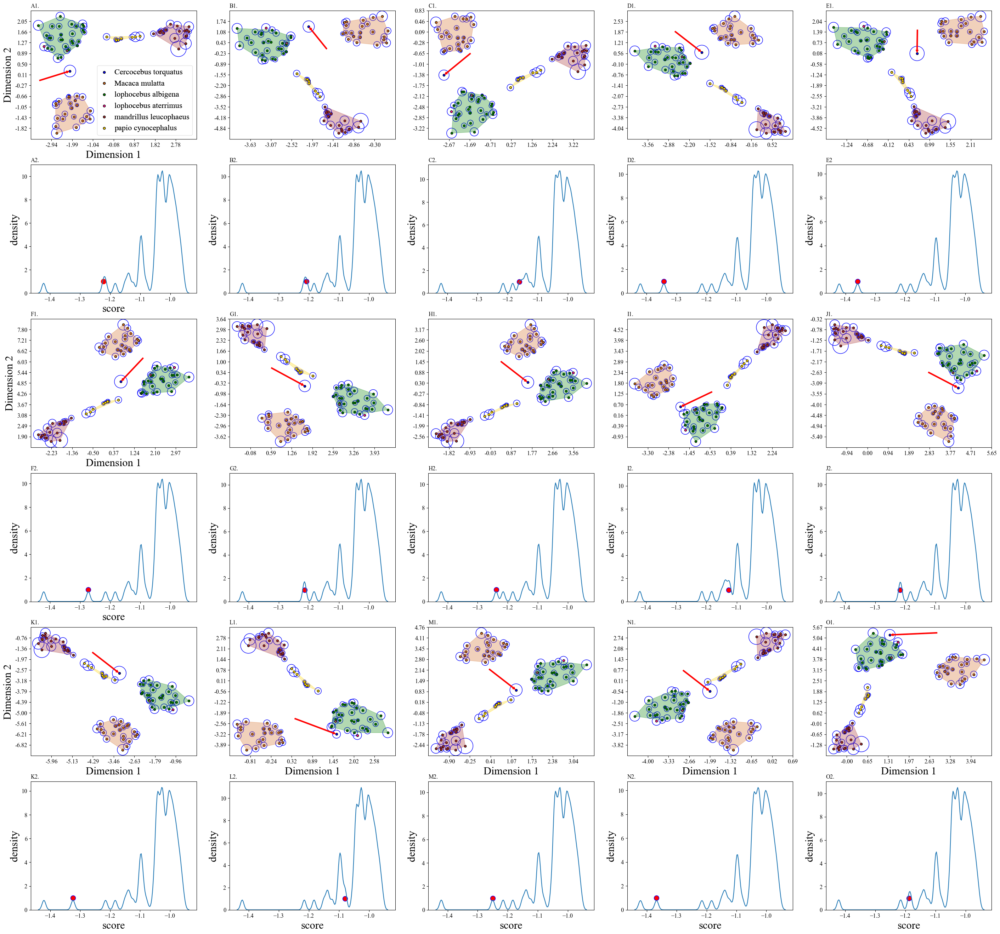

In [76]:
# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'lof', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'lof', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 170)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
fig_axes[0,1].set(xlabel=None)
fig_axes[0,1].set(ylabel=None)
prpca2.plot_tsne(method = 'lof', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -120)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
fig_axes[0,2].set(xlabel=None)
fig_axes[0,2].set(ylabel=None)
prpca3.plot_tsne(method = 'lof', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
fig_axes[0,3].set(xlabel=None)
fig_axes[0,3].set(ylabel=None)
prpca4.plot_tsne(method = 'lof', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -30)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
fig_axes[0,4].set(xlabel=None)
fig_axes[0,4].set(ylabel=None)
prpca5.plot_tsne(method = 'lof', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'lof', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
fig_axes[2,1].set(xlabel=None)
fig_axes[2,1].set(ylabel=None)
prpca7.plot_tsne(method = 'lof', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
fig_axes[2,2].set(xlabel=None)
fig_axes[2,2].set(ylabel=None)
prpca8.plot_tsne(method = 'lof', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -110)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
fig_axes[2,3].set(xlabel=None)
fig_axes[2,3].set(ylabel=None)
prpca9.plot_tsne(method = 'lof', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
fig_axes[2,4].set(xlabel=None)
fig_axes[2,4].set(ylabel=None)
prpca10.plot_tsne(method = 'lof', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'lof', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 20)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
#fig_axes[4,1].set(xlabel=None)
fig_axes[4,1].set(ylabel=None)
prpca12.plot_tsne(method = 'lof', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
#fig_axes[4,2].set(xlabel=None)
fig_axes[4,2].set(ylabel=None)
prpca13.plot_tsne(method = 'lof', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 0)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
#fig_axes[4,3].set(xlabel=None)
fig_axes[4,3].set(ylabel=None)
prpca14.plot_tsne(method = 'lof', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -120)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')
3#fig_axes[4,4].set(xlabel=None)
fig_axes[4,4].set(ylabel=None)

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 1, c='r', s=100)
fig_axes[1,0].set_xlabel('score', fontsize = 22)
fig_axes[1,0].set_ylabel('density', fontsize = 22)
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
fig_axes[1,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,1].set_xlabel('score', fontsize = 22)
fig_axes[1,1].set_ylabel('density', fontsize = 22)
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
fig_axes[1,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,2].set_xlabel('score', fontsize = 22)
fig_axes[1,2].set_ylabel('density', fontsize = 22)
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
fig_axes[1,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,3].set_xlabel('score', fontsize = 22)
fig_axes[1,3].set_ylabel('density', fontsize = 22)
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
fig_axes[1,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[1,4].set_xlabel('score', fontsize = 22)
fig_axes[1,4].set_ylabel('density', fontsize = 22)
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
fig_axes[1,4].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[3,0].set_xlabel('score', fontsize = 22)
fig_axes[3,0].set_ylabel('density', fontsize = 22)
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
fig_axes[3,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,1].set_xlabel('score', fontsize = 22)
fig_axes[3,1].set_ylabel('density', fontsize = 22)
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
fig_axes[3,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,2].set_xlabel('score', fontsize = 22)
fig_axes[3,2].set_ylabel('density', fontsize = 22)
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
fig_axes[3,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,3].set_xlabel('score', fontsize = 22)
fig_axes[3,3].set_ylabel('density', fontsize = 22)
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
fig_axes[3,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 1, c='r', edgecolors='b', s=100)
#fig_axes[3,4].set_xlabel('score', fontsize = 22)
fig_axes[3,4].set_ylabel('density', fontsize = 22)
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
fig_axes[3,4].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,0].set_xlabel('score', fontsize = 22)
fig_axes[5,0].set_ylabel('density', fontsize = 22)
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
fig_axes[5,0].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,1].set_xlabel('score', fontsize = 22)
fig_axes[5,1].set_ylabel('density', fontsize = 22)
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
fig_axes[5,1].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,2].set_xlabel('score', fontsize = 22)
fig_axes[5,2].set_ylabel('density', fontsize = 22)
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
fig_axes[5,2].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,3].set_xlabel('score', fontsize = 22)
fig_axes[5,3].set_ylabel('density', fontsize = 22)
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
fig_axes[5,3].tick_params(axis='both', which='major', labelsize=12)
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 1, c='r', edgecolors='b', s=100)
fig_axes[5,4].set_xlabel('score', fontsize = 22)
fig_axes[5,4].set_ylabel('density', fontsize = 22)
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')
fig_axes[5,4].tick_params(axis='both', which='major', labelsize=12)


plt.savefig('Cercocebus_torquatus.svg', transparent = False)
plt.show()

In [63]:
tab = []
for i in range(15):
    tab.append(np.round((globals()[f"X_scores{i}"][-1]), decimals=2))

tab = pd.DataFrame(tab)
tab.to_excel('table.xlsx')

In [64]:
tab.mean()

0   -1.238
dtype: float64

In [65]:
model = LocalOutlierFactor(n_neighbors=5, contamination='auto')

In [66]:
prpca = procpca(df)
dataf, datag, ind, name= prpca.read('without_cercocebus_torquatus_84,85,86,87,90,92_remains.txt')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [67]:
Xs92 = prpca.GPApt
y92 = prpca.y

In [68]:
y_pred0 = model.fit_predict(Xs92)
X_scores92 = model.negative_outlier_factor_

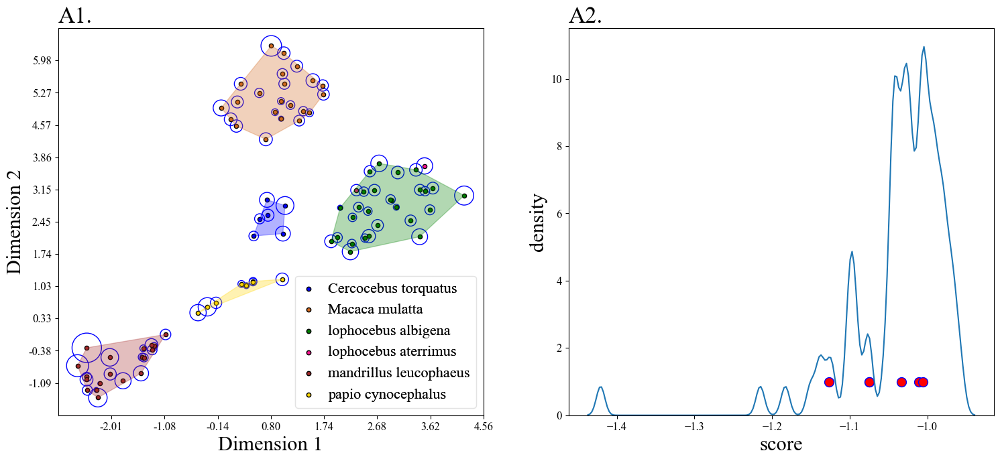

In [78]:
fig, fig_axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 7.5))

prpca.plot_tsne(method = 'lof', ax = fig_axes[0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=False, ind_o=-1, rotate = 75, dlegend=True)
fig_axes[0].set_title('A1.', fontsize = 25, loc = 'left')
sns.kdeplot(X_scores92, bw_adjust= 0.2, ax = fig_axes[1])
fig_axes[1].scatter(X_scores92[-6:], np.ones(6), c='r', edgecolors='b', s = 100)
fig_axes[1].set_xlabel('score', fontsize = 22)
fig_axes[1].set_ylabel('density', fontsize = 22)
fig_axes[1].tick_params(axis='both', which='major', labelsize=12)
fig_axes[1].set_title('A2.', fontsize = 25, loc = 'left')

plt.savefig('without_cercocebus_torquatus_84,85,86,87,90,92_remains.svg', transparent = True)
plt.show()

In [80]:
X_scores92[-6:]

array([-1.07471845, -1.03383416, -1.01065086, -1.12639738, -1.00563655,
       -1.07509134])

In [81]:
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('PCA_all.txt')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [82]:
Xs92 = prpca.GPApt
y92 = prpca.y

In [83]:
y_pred0 = model.fit_predict(Xs92)
X_scores92 = model.negative_outlier_factor_

In [84]:
pd.DataFrame(np.round(X_scores92[-15:], decimals=2))

,0
0,-0.98
1,-1.02
2,-1.01
3,-0.99
4,-1.03
5,-1.03
6,-1.02
7,-1.06
8,-1.04
9,-1.06


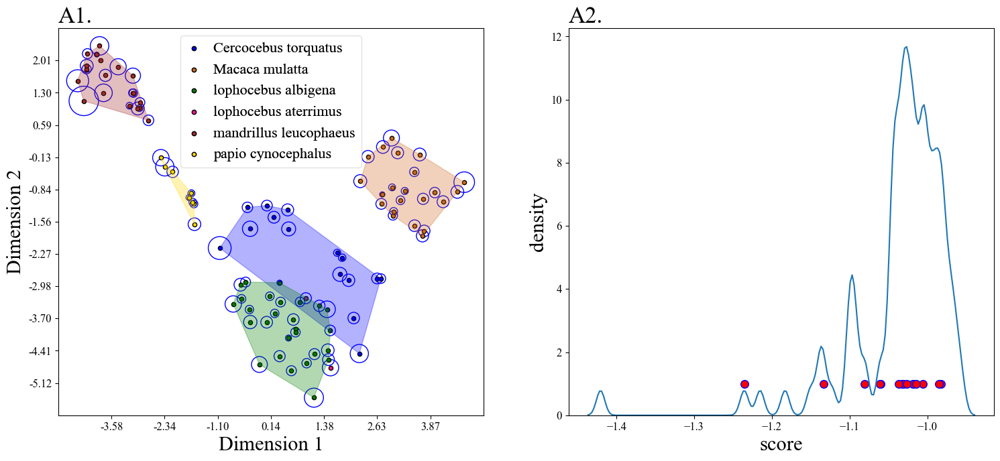

In [88]:
fig, fig_axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 7.5))

prpca.plot_tsne(method = 'lof', ax = fig_axes[0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=False, ind_o=-1, rotate = 75, dlegend=True)
fig_axes[0].set_title('A1.', fontsize = 25, loc = 'left')
sns.kdeplot(X_scores92, bw_adjust= 0.2, ax = fig_axes[1])
fig_axes[1].scatter(X_scores92[-15:], np.ones(15), c='r', edgecolors='b', s = 70)
fig_axes[1].set_xlabel('score', fontsize = 22)
fig_axes[1].set_ylabel('density', fontsize = 22)
fig_axes[1].tick_params(axis='both', which='major', labelsize=12)
fig_axes[1].set_title('A2.', fontsize = 25, loc = 'left')


plt.savefig('without_cercocebus_torquatus_all_remain.svg', transparent = True)
plt.show()

In [64]:
X_scores92[-15:]

array([-0.98268459, -1.01850295, -1.0057922 , -0.98543155, -1.03298686,
       -1.03093591, -1.01799813, -1.06021065, -1.03699325, -1.06127686,
       -1.01479712, -1.02660989, -1.08131403, -1.23569826, -1.13367661])

In [80]:
model = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty = True)

In [61]:
y_pred92 = model.fit(Xs92[:-1])
X_scores92 = model.predict(Xs92[-1].reshape(1, -1))

In [62]:
X_scores92

array([1])

In [71]:
mask = np.ones(len(Xs92), dtype = bool)

In [72]:
mask[-3] = False

In [73]:
y_pred92 = model.fit(Xs92[mask])
X_scores92 = model.predict(Xs92[-3].reshape(1, -1))

In [74]:
X_scores92

array([1])

In [70]:
model = LocalOutlierFactor(n_neighbors=5, contamination='auto', novelty = True)

In [71]:
y_pred0 = model.fit(Xs0[:-1])
X_scores0 = model.decision_function(Xs0[-1].reshape(1, -1))
y_pred1 = model.fit(Xs1[:-1])
X_scores1 = model.decision_function(Xs1[-1].reshape(1, -1))
y_pred2 = model.fit(Xs2[:-1])
X_scores2 = model.decision_function(Xs2[-1].reshape(1, -1))
y_pred3 = model.fit(Xs3[:-1])
X_scores3 = model.decision_function(Xs3[-1].reshape(1, -1))
y_pred4 = model.fit(Xs4[:-1])
X_scores4 = model.decision_function(Xs4[-1].reshape(1, -1))
y_pred5 = model.fit(Xs5[:-1])
X_scores5 = model.decision_function(Xs5[-1].reshape(1, -1))
y_pred6 = model.fit(Xs6[:-1])
X_scores6 = model.decision_function(Xs6[-1].reshape(1, -1))
y_pred7 = model.fit(Xs7[:-1])
X_scores7 = model.decision_function(Xs7[-1].reshape(1, -1))
y_pred8 = model.fit(Xs8[:-1])
X_scores8 = model.decision_function(Xs8[-1].reshape(1, -1))
y_pred9 = model.fit(Xs9[:-1])
X_scores9 = model.decision_function(Xs9[-1].reshape(1, -1))
y_pred10 = model.fit(Xs10[:-1])
X_scores10 = model.decision_function(Xs10[-1].reshape(1, -1))
y_pred11 = model.fit(Xs11[:-1])
X_scores11 = model.decision_function(Xs11[-1].reshape(1, -1))
y_pred12 = model.fit(Xs12[:-1])
X_scores12 = model.decision_function(Xs12[-1].reshape(1, -1))
y_pred13 = model.fit(Xs13[:-1])
X_scores13 = model.decision_function(Xs13[-1].reshape(1, -1))
y_pred14 = model.fit(Xs14[:-1])
X_scores14 = model.decision_function(Xs14[-1].reshape(1, -1))

In [72]:
y_pred0 = model.fit(Xs0[:-1])
X_scores0 = model.predict(Xs0[-1].reshape(1, -1))
y_pred1 = model.fit(Xs1[:-1])
X_scores1 = model.predict(Xs1[-1].reshape(1, -1))
y_pred2 = model.fit(Xs2[:-1])
X_scores2 = model.predict(Xs2[-1].reshape(1, -1))
y_pred3 = model.fit(Xs3[:-1])
X_scores3 = model.predict(Xs3[-1].reshape(1, -1))
y_pred4 = model.fit(Xs4[:-1])
X_scores4 = model.predict(Xs4[-1].reshape(1, -1))
y_pred5 = model.fit(Xs5[:-1])
X_scores5 = model.predict(Xs5[-1].reshape(1, -1))
y_pred6 = model.fit(Xs6[:-1])
X_scores6 = model.predict(Xs6[-1].reshape(1, -1))
y_pred7 = model.fit(Xs7[:-1])
X_scores7 = model.predict(Xs7[-1].reshape(1, -1))
y_pred8 = model.fit(Xs8[:-1])
X_scores8 = model.predict(Xs8[-1].reshape(1, -1))
y_pred9 = model.fit(Xs9[:-1])
X_scores9 = model.predict(Xs9[-1].reshape(1, -1))
y_pred10 = model.fit(Xs10[:-1])
X_scores10 = model.predict(Xs10[-1].reshape(1, -1))
y_pred11 = model.fit(Xs11[:-1])
X_scores11 = model.predict(Xs11[-1].reshape(1, -1))
y_pred12 = model.fit(Xs12[:-1])
X_scores12 = model.predict(Xs12[-1].reshape(1, -1))
y_pred13 = model.fit(Xs13[:-1])
X_scores13 = model.predict(Xs13[-1].reshape(1, -1))
y_pred14 = model.fit(Xs14[:-1])
X_scores14 = model.predict(Xs14[-1].reshape(1, -1))

In [73]:
for i in range(15):
    print(i, globals()[f"X_scores{2}"])

0 [1]
1 [1]
2 [1]
3 [1]
4 [1]
5 [1]
6 [1]
7 [1]
8 [1]
9 [1]
10 [1]
11 [1]
12 [1]
13 [1]
14 [1]


# Novelty Detection Isolation Forest

In [68]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [69]:
Xs0 = prpca0.GPApt
y0 = prpca0.y
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y
Xs4 = prpca4.GPApt
y4 = prpca4.y
Xs5 = prpca5.GPApt
y5 = prpca5.y
Xs6 = prpca6.GPApt
y6 = prpca6.y
Xs7 = prpca7.GPApt
y7 = prpca7.y
Xs8 = prpca8.GPApt
y8 = prpca8.y
Xs9 = prpca9.GPApt
y9 = prpca9.y
Xs10 = prpca10.GPApt
y10 = prpca10.y
Xs11 = prpca11.GPApt
y11 = prpca11.y
Xs12 = prpca12.GPApt
y12 = prpca12.y
Xs13 = prpca13.GPApt
y13 = prpca13.y
Xs14 = prpca14.GPApt
y14 = prpca14.y

In [13]:
from sklearn.ensemble import IsolationForest
model = IsolationForest(random_state=0)

In [14]:
y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.score_samples(Xs0)
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.score_samples(Xs1)
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.score_samples(Xs2)
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.score_samples(Xs3)
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.score_samples(Xs4)
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.score_samples(Xs5)
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.score_samples(Xs6)
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.score_samples(Xs7)
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.score_samples(Xs8)
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.score_samples(Xs9)
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.score_samples(Xs10)
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.score_samples(Xs11)
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.score_samples(Xs12)
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.score_samples(Xs13)
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.score_samples(Xs14)

In [22]:
X_scores14p = model.decision_function(Xs14)

c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:750: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:750: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The de

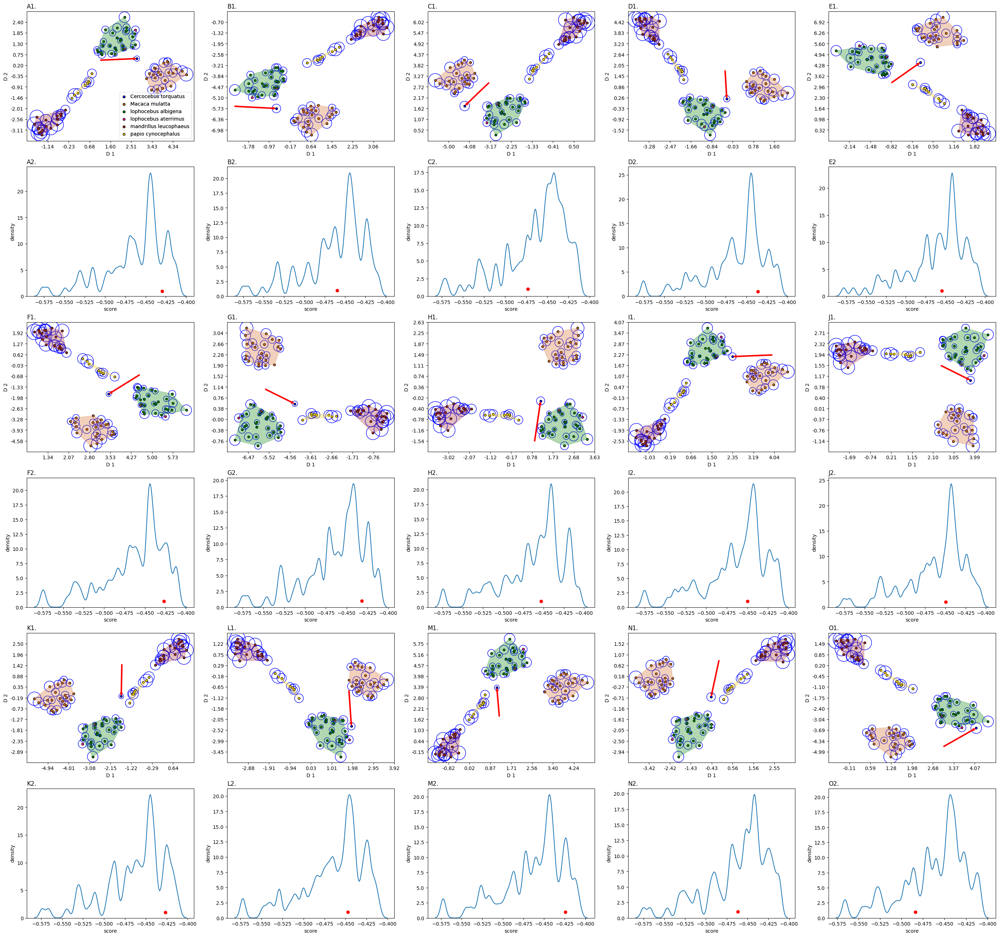

In [18]:
# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'if', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'if', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
prpca2.plot_tsne(method = 'if', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -90)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
prpca3.plot_tsne(method = 'if', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -40)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
prpca4.plot_tsne(method = 'if', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
prpca5.plot_tsne(method = 'if', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'if', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
prpca7.plot_tsne(method = 'if', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
prpca8.plot_tsne(method = 'if', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -130)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
prpca9.plot_tsne(method = 'if', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
prpca10.plot_tsne(method = 'if', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'if', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
prpca12.plot_tsne(method = 'if', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 140)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
prpca13.plot_tsne(method = 'if', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -70)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
prpca14.plot_tsne(method = 'if', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 100)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 1, c='r')
fig_axes[1,0].set_xlabel('score')
fig_axes[1,0].set_ylabel('density')
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 1, c='r')
fig_axes[1,1].set_xlabel('score')
fig_axes[1,1].set_ylabel('density')
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 1, c='r')
fig_axes[1,2].set_xlabel('score')
fig_axes[1,2].set_ylabel('density')
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 1, c='r')
fig_axes[1,3].set_xlabel('score')
fig_axes[1,3].set_ylabel('density')
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 1, c='r')
fig_axes[1,4].set_xlabel('score')
fig_axes[1,4].set_ylabel('density')
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 1, c='r')
fig_axes[3,0].set_xlabel('score')
fig_axes[3,0].set_ylabel('density')
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 1, c='r')
fig_axes[3,1].set_xlabel('score')
fig_axes[3,1].set_ylabel('density')
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 1, c='r')
fig_axes[3,2].set_xlabel('score')
fig_axes[3,2].set_ylabel('density')
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 1, c='r')
fig_axes[3,3].set_xlabel('score')
fig_axes[3,3].set_ylabel('density')
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 1, c='r')
fig_axes[3,4].set_xlabel('score')
fig_axes[3,4].set_ylabel('density')
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 1, c='r')
fig_axes[5,0].set_xlabel('score')
fig_axes[5,0].set_ylabel('density')
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 1, c='r')
fig_axes[5,1].set_xlabel('score')
fig_axes[5,1].set_ylabel('density')
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 1, c='r')
fig_axes[5,2].set_xlabel('score')
fig_axes[5,2].set_ylabel('density')
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 1, c='r')
fig_axes[5,3].set_xlabel('score')
fig_axes[5,3].set_ylabel('density')
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 1, c='r')
fig_axes[5,4].set_xlabel('score')
fig_axes[5,4].set_ylabel('density')
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')


plt.savefig('Cercocebus_torquatus_IF.svg', transparent = True)
plt.show()

# Novelty Detection One Class SVM

In [25]:
prpca0 = procpca(df)
dataf, datag, ind, name= prpca0.read('without_cercocebus_torquatus_0_remains.txt')
prpca0.post_process(deletg='Cercocebus torquatus')
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('without_cercocebus_torquatus_1_remains.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('without_cercocebus_torquatus_2_remains.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('without_cercocebus_torquatus_3_remains.txt')
prpca3.post_process(deletg='Cercocebus torquatus')
prpca4 = procpca(df)
dataf, datag, ind, name= prpca4.read('without_cercocebus_torquatus_4_remains.txt')
prpca4.post_process(deletg='Cercocebus torquatus')
prpca5 = procpca(df)
dataf, datag, ind, name= prpca5.read('without_cercocebus_torquatus_5_remains.txt')
prpca5.post_process(deletg='Cercocebus torquatus')
prpca6 = procpca(df)
dataf, datag, ind, name= prpca6.read('without_cercocebus_torquatus_6_remains.txt')
prpca6.post_process(deletg='Cercocebus torquatus')
prpca7 = procpca(df)
dataf, datag, ind, name= prpca7.read('without_cercocebus_torquatus_7_remains.txt')
prpca7.post_process(deletg='Cercocebus torquatus')
prpca8 = procpca(df)
dataf, datag, ind, name= prpca8.read('without_cercocebus_torquatus_8_remains.txt')
prpca8.post_process(deletg='Cercocebus torquatus')
prpca9 = procpca(df)
dataf, datag, ind, name= prpca9.read('without_cercocebus_torquatus_9_remains.txt')
prpca9.post_process(deletg='Cercocebus torquatus')
prpca10 = procpca(df)
dataf, datag, ind, name= prpca10.read('without_cercocebus_torquatus_10_remains.txt')
prpca10.post_process(deletg='Cercocebus torquatus')
prpca11 = procpca(df)
dataf, datag, ind, name= prpca11.read('without_cercocebus_torquatus_11_remains.txt')
prpca11.post_process(deletg='Cercocebus torquatus')
prpca12 = procpca(df)
dataf, datag, ind, name= prpca12.read('without_cercocebus_torquatus_12_remains.txt')
prpca12.post_process(deletg='Cercocebus torquatus')
prpca13 = procpca(df)
dataf, datag, ind, name= prpca13.read('without_cercocebus_torquatus_13_remains.txt')
prpca13.post_process(deletg='Cercocebus torquatus')
prpca14 = procpca(df)
dataf, datag, ind, name= prpca14.read('without_cercocebus_torquatus_14_remains.txt')
prpca14.post_process(deletg='Cercocebus torquatus')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [26]:
Xs0 = prpca0.GPApt
y0 = prpca0.y
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y
Xs4 = prpca4.GPApt
y4 = prpca4.y
Xs5 = prpca5.GPApt
y5 = prpca5.y
Xs6 = prpca6.GPApt
y6 = prpca6.y
Xs7 = prpca7.GPApt
y7 = prpca7.y
Xs8 = prpca8.GPApt
y8 = prpca8.y
Xs9 = prpca9.GPApt
y9 = prpca9.y
Xs10 = prpca10.GPApt
y10 = prpca10.y
Xs11 = prpca11.GPApt
y11 = prpca11.y
Xs12 = prpca12.GPApt
y12 = prpca12.y
Xs13 = prpca13.GPApt
y13 = prpca13.y
Xs14 = prpca14.GPApt
y14 = prpca14.y

In [27]:
from sklearn.svm import OneClassSVM
model = OneClassSVM(gamma='auto')

In [28]:
y_pred0 = model.fit_predict(Xs0)
X_scores0 = model.score_samples(Xs0)
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.score_samples(Xs1)
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.score_samples(Xs2)
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.score_samples(Xs3)
y_pred4 = model.fit_predict(Xs4)
X_scores4 = model.score_samples(Xs4)
y_pred5 = model.fit_predict(Xs5)
X_scores5 = model.score_samples(Xs5)
y_pred6 = model.fit_predict(Xs6)
X_scores6 = model.score_samples(Xs6)
y_pred7 = model.fit_predict(Xs7)
X_scores7 = model.score_samples(Xs7)
y_pred8 = model.fit_predict(Xs8)
X_scores8 = model.score_samples(Xs8)
y_pred9 = model.fit_predict(Xs9)
X_scores9 = model.score_samples(Xs9)
y_pred10 = model.fit_predict(Xs10)
X_scores10 = model.score_samples(Xs10)
y_pred11 = model.fit_predict(Xs11)
X_scores11 = model.score_samples(Xs11)
y_pred12 = model.fit_predict(Xs12)
X_scores12 = model.score_samples(Xs12)
y_pred13 = model.fit_predict(Xs13)
X_scores13 = model.score_samples(Xs13)
y_pred14 = model.fit_predict(Xs14)
X_scores14 = model.score_samples(Xs14)

c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:765: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
c:\Research\New\Research\PhD\Neanderthal\Landmark_monkey\Morphometrics_2.py:765: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  arrow = mpatches.FancyArrowPatch((xt, yt), (X_embedded[ind_o, 0], X_embedded[ind_o, 1]),
c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning: The de

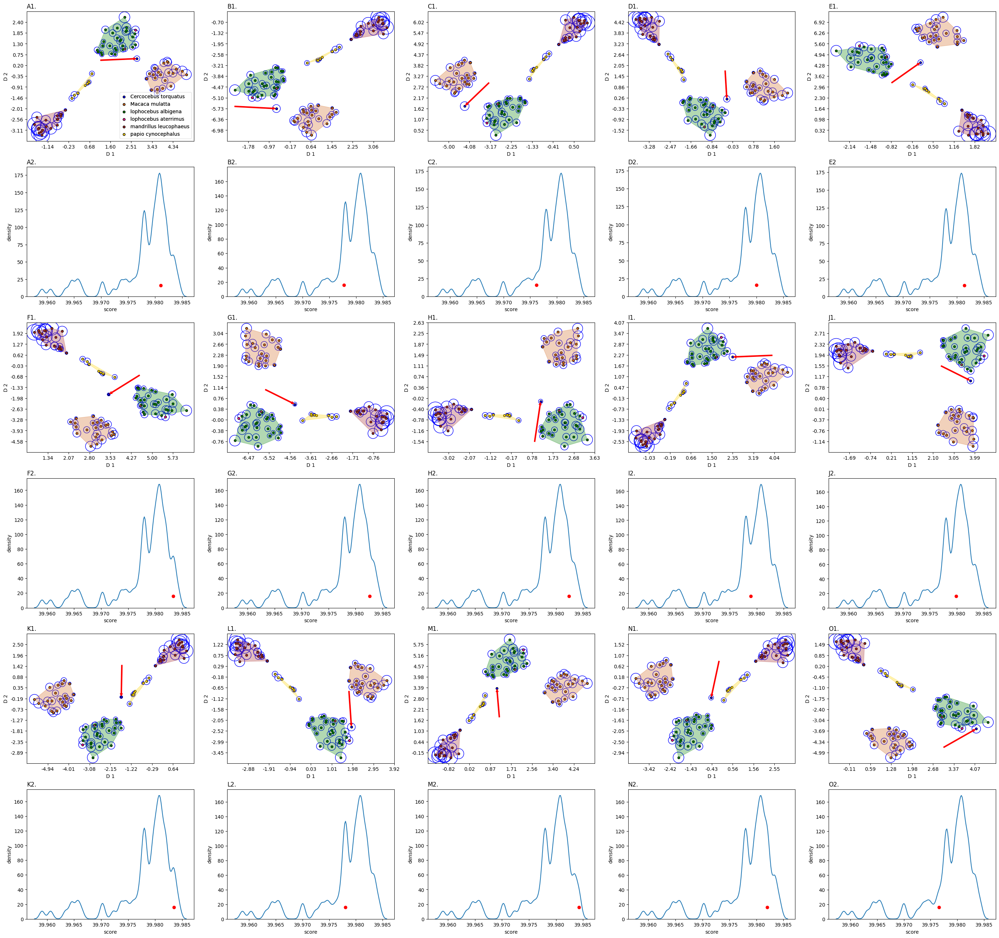

In [30]:
# Plotting the t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=6, figsize=(35,33))

prpca0.plot_tsne(method = 'ocsvm', ax = fig_axes[0,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45, dlegend=True)
fig_axes[0,0].set_title('A1.', fontsize = 12, loc = 'left')
prpca1.plot_tsne(method = 'ocsvm', ax = fig_axes[0,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 45)
fig_axes[0,1].set_title('B1.', fontsize = 12, loc = 'left')
prpca2.plot_tsne(method = 'ocsvm', ax = fig_axes[0,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -90)
fig_axes[0,2].set_title('C1.', fontsize = 12, loc = 'left')
prpca3.plot_tsne(method = 'ocsvm', ax = fig_axes[0,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -40)
fig_axes[0,3].set_title('D1.', fontsize = 12, loc = 'left')
prpca4.plot_tsne(method = 'ocsvm', ax = fig_axes[0,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[0,4].set_title('E1.', fontsize = 12, loc = 'left')
prpca5.plot_tsne(method = 'ocsvm', ax = fig_axes[2,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -80)
fig_axes[2,0].set_title('F1.', fontsize = 12, loc = 'left')
prpca6.plot_tsne(method = 'ocsvm', ax = fig_axes[2,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,1].set_title('G1.', fontsize = 12, loc = 'left')
prpca7.plot_tsne(method = 'ocsvm', ax = fig_axes[2,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 110)
fig_axes[2,2].set_title('H1.', fontsize = 12, loc = 'left')
prpca8.plot_tsne(method = 'ocsvm', ax = fig_axes[2,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -130)
fig_axes[2,3].set_title('I1.', fontsize = 12, loc = 'left')
prpca9.plot_tsne(method = 'ocsvm', ax = fig_axes[2,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 10)
fig_axes[2,4].set_title('J1.', fontsize = 12, loc = 'left')
prpca10.plot_tsne(method = 'ocsvm', ax = fig_axes[4,0], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,0].set_title('K1.', fontsize = 12, loc = 'left')
prpca11.plot_tsne(method = 'ocsvm', ax = fig_axes[4,1], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -50)
fig_axes[4,1].set_title('L1.', fontsize = 12, loc = 'left')
prpca12.plot_tsne(method = 'ocsvm', ax = fig_axes[4,2], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 140)
fig_axes[4,2].set_title('M1.', fontsize = 12, loc = 'left')
prpca13.plot_tsne(method = 'ocsvm', ax = fig_axes[4,3], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = -70)
fig_axes[4,3].set_title('N1.', fontsize = 12, loc = 'left')
prpca14.plot_tsne(method = 'ocsvm', ax = fig_axes[4,4], index_r = 0, perplexity=40, n_neighbors=5, annote_o=True, ind_o=-1, rotate = 100)
fig_axes[4,4].set_title('O1.', fontsize = 12, loc = 'left')

sns.kdeplot(X_scores0, bw_adjust= 0.2, ax = fig_axes[1,0])
fig_axes[1,0].scatter(X_scores0[-1], 16, c='r')
fig_axes[1,0].set_xlabel('score')
fig_axes[1,0].set_ylabel('density')
fig_axes[1,0].set_title('A2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores1, bw_adjust= 0.2, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores1[-1], 16, c='r')
fig_axes[1,1].set_xlabel('score')
fig_axes[1,1].set_ylabel('density')
fig_axes[1,1].set_title('B2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores2, bw_adjust= 0.2, ax = fig_axes[1,2])
fig_axes[1,2].scatter(X_scores2[-1], 16, c='r')
fig_axes[1,2].set_xlabel('score')
fig_axes[1,2].set_ylabel('density')
fig_axes[1,2].set_title('C2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores3, bw_adjust= 0.2, ax = fig_axes[1,3])
fig_axes[1,3].scatter(X_scores3[-1], 16, c='r')
fig_axes[1,3].set_xlabel('score')
fig_axes[1,3].set_ylabel('density')
fig_axes[1,3].set_title('D2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores4, bw_adjust= 0.2, ax = fig_axes[1,4])
fig_axes[1,4].scatter(X_scores4[-1], 16, c='r')
fig_axes[1,4].set_xlabel('score')
fig_axes[1,4].set_ylabel('density')
fig_axes[1,4].set_title('E2', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores5, bw_adjust= 0.2, ax = fig_axes[3,0])
fig_axes[3,0].scatter(X_scores5[-1], 16, c='r')
fig_axes[3,0].set_xlabel('score')
fig_axes[3,0].set_ylabel('density')
fig_axes[3,0].set_title('F2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores6, bw_adjust= 0.2, ax = fig_axes[3,1])
fig_axes[3,1].scatter(X_scores6[-1], 16, c='r')
fig_axes[3,1].set_xlabel('score')
fig_axes[3,1].set_ylabel('density')
fig_axes[3,1].set_title('G2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores7, bw_adjust= 0.2, ax = fig_axes[3,2])
fig_axes[3,2].scatter(X_scores7[-1], 16, c='r')
fig_axes[3,2].set_xlabel('score')
fig_axes[3,2].set_ylabel('density')
fig_axes[3,2].set_title('H2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores8, bw_adjust= 0.2, ax = fig_axes[3,3])
fig_axes[3,3].scatter(X_scores8[-1], 16, c='r')
fig_axes[3,3].set_xlabel('score')
fig_axes[3,3].set_ylabel('density')
fig_axes[3,3].set_title('I2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores9, bw_adjust= 0.2, ax = fig_axes[3,4])
fig_axes[3,4].scatter(X_scores9[-1], 16, c='r')
fig_axes[3,4].set_xlabel('score')
fig_axes[3,4].set_ylabel('density')
fig_axes[3,4].set_title('J2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores10, bw_adjust= 0.2, ax = fig_axes[5,0])
fig_axes[5,0].scatter(X_scores10[-1], 16, c='r')
fig_axes[5,0].set_xlabel('score')
fig_axes[5,0].set_ylabel('density')
fig_axes[5,0].set_title('K2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores11, bw_adjust= 0.2, ax = fig_axes[5,1])
fig_axes[5,1].scatter(X_scores11[-1], 16, c='r')
fig_axes[5,1].set_xlabel('score')
fig_axes[5,1].set_ylabel('density')
fig_axes[5,1].set_title('L2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores12, bw_adjust= 0.2, ax = fig_axes[5,2])
fig_axes[5,2].scatter(X_scores12[-1], 16, c='r')
fig_axes[5,2].set_xlabel('score')
fig_axes[5,2].set_ylabel('density')
fig_axes[5,2].set_title('M2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores13, bw_adjust= 0.2, ax = fig_axes[5,3])
fig_axes[5,3].scatter(X_scores13[-1], 16, c='r')
fig_axes[5,3].set_xlabel('score')
fig_axes[5,3].set_ylabel('density')
fig_axes[5,3].set_title('N2.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores14, bw_adjust= 0.2, ax = fig_axes[5,4])
fig_axes[5,4].scatter(X_scores14[-1], 16, c='r')
fig_axes[5,4].set_xlabel('score')
fig_axes[5,4].set_ylabel('density')
fig_axes[5,4].set_title('O2.', fontsize = 12, loc = 'left')


plt.savefig('Cercocebus_torquatus_OCSVM.svg', transparent = True)
plt.show()

# Feature selection with genetic algorithm

In [6]:
prpca = procpca(df)
dataf, datag, ind, name= prpca.read('all without 11, 12, 16, 17, 18, 30, 31.txt')
prpca.post_process()

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [7]:
Xs = prpca.GPApt
Xr = prpca.Xr
y = prpca.y
ys = prpca.ys
y0 = prpca.y0

In [8]:
Xr.shape

(92, 72)

In [9]:
ys.shape

(92,)

In [17]:
model = LogisticRegression(C= 100, penalty= 'l1', solver= 'liblinear')

In [18]:
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=1)

In [23]:
from genetic_selection import GeneticSelectionCV

In [24]:
report = pd.DataFrame()

In [25]:
nofeats = [] 
chosen_feats = [] 
cvscore = []
plotgen = []

In [26]:
for i in range(5):
  selector = GeneticSelectionCV(model,
                                cv = cv,
                                verbose = 0,
                                scoring = 'accuracy',
                                max_features = Xr.shape[1],
                                n_population =1000,
                                crossover_proba = 0.7,
                                mutation_proba = 0.3,
                                n_generations = 25,
                                crossover_independent_proba=0.7,
                                mutation_independent_proba=0.3,
                                tournament_size = 1,
                                n_gen_no_change=5,
                                caching=True,
                                n_jobs=-1)
  selector = selector.fit(Xr, ys)
  genfeats = selector.support_
  genfeats = list(genfeats)
  cv_score = selector.generation_scores_[-1]
  print("Chosen Feats:  ", genfeats, cv_score)
  nofeats.append(len(genfeats)) 
  chosen_feats.append(genfeats) 
  cvscore.append(cv_score)
  plotgen.append(selector.generation_scores_)
  sav = [nofeats, chosen_feats, cvscore, plotgen]
report["No of Feats"] = nofeats
report["Chosen Feats"] = chosen_feats
report["Scores"] = cvscore

c:\Users\edria\anaconda3\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Chosen Feats:   [False, False, False, True, False, False, False, True, False, False, False, False, True, True, True, True, False, False, True, True, False, False, True, False, False, True, False, True, False, False, False, True, False, True, False, False, True, True, False, True, False, True, True, False, False, False, True, True, False, False, False, False, True, False, True, False, False, False, True, False, False, True, True, False, False, False, True, True, False, True, True, True] 0.9839181286549706
Chosen Feats:   [True, True, True, False, False, False, False, True, True, True, True, True, False, False, True, False, False, False, True, True, False, True, True, True, False, True, True, False, True, False, False, False, False, True, False, False, True, False, False, False, True, True, True, False, True, True, False, False, False, True, False, True, True, True, True, True, False, False, False, True, False, False, True, True, True, False, False, False, True, False, True, False] 0.989

c:\Users\edria\anaconda3\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Chosen Feats:   [False, False, False, False, False, False, True, False, False, True, True, True, False, False, True, False, False, False, True, True, False, True, True, False, True, True, False, True, False, False, False, False, False, True, True, True, False, True, False, False, False, False, True, False, True, False, True, True, True, True, False, False, True, False, True, False, False, False, False, False, False, False, False, False, False, False, False, True, True, False, False, True] 0.9839181286549706


c:\Users\edria\anaconda3\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Chosen Feats:   [False, False, False, False, True, False, False, True, True, True, False, True, True, True, True, False, True, False, True, True, False, False, True, True, True, True, True, False, False, False, False, True, False, False, True, True, False, False, False, False, True, False, True, False, True, False, False, False, False, False, False, True, True, False, True, False, False, False, False, True, True, False, False, False, False, False, True, True, True, False, False, True] 0.9891812865497076
Chosen Feats:   [False, False, False, True, True, True, False, True, False, True, True, False, False, False, True, True, True, False, False, False, False, True, False, False, True, True, True, False, False, False, False, True, False, True, True, True, True, True, True, False, True, False, False, False, True, False, False, True, True, False, False, False, False, False, True, False, False, False, False, False, True, True, True, False, True, True, True, True, True, False, True, False] 0.98

In [20]:
mask1 = [False, False, False, True, False, False, False, True, False, False, False, False, True, True, True,
True, False, False, True, True, False, False, True, False, False, True, False, True, False, False, False, True,
False, True, False, False, True, True, False, True, False, True, True, False, False, False, True, True, False,
False, False, False, True, False, True, False, False, False, True, False, False, True, True, False, False,
False, True, True, False, True, True, True]
mask2 = [True, True, True, False, False, False, False, True, True, True, True, True, False, False, True, False,
False, False, True, True, False, True, True, True, False, True, True, False, True, False, False, False, False,
True, False, False, True, False, False, False, True, True, True, False, True, True, False, False, False, True,
False, True, True, True, True, True, False, False, False, True, False, False, True, True, True, False, False,
False, True, False, True, False]
mask3 = [False, False, False, False, True, False, False, True, True, True, False, True, True, True, True, False,
True, False, True, True, False, False, True, True, True, True, True, False, False, False, False, True, False,
False, True, True, False, False, False, False, True, False, True, False, True, False, False, False, False,
False, False, True, True, False, True, False, False, False, False, True, True, False, False, False, False,
False, True, True, True, False, False, True]
mask4 = [False, False, False, True, True, True, False, True, False, True, True, False, False, False, True, True,
True, False, False, False, False, True, False, False, True, True, True, False, False, False, False, True, False,
True, True, True, True, True, True, False, True, False, False, False, True, False, False, True, True, False,
False, False, False, False, True, False, False, False, False, False, True, True, True, False, True, True,
True, True, True, False, True, False]
mask5 = [False, False, False, True, True, True, False, True, False, True, True, False, False, False, True, True, True,
False, False, False, False, True, False, False, True, True, True, False, False, False, False, True, False, True,
True, True, True, True, True, False, True, False, False, False, True, False, False, True, True, False, False,
False, False, False, True, False, False, False, False, False, True, True, True, False, True, True, True,
True, True, False, True, False]

In [43]:
def evalc(clf, maskf = None):

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []
    yp = []

    if maskf == None:
        maskf = np.ones(Xs.shape[1], dtype = 'bool')
    else:
        pass

    for train, test in cv.split(Xs, y):

        mask = np.ones(len(y[train]), dtype = bool)
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False

        clf.fit(Xs[train][mask][:, maskf], encoder.transform(y[train][mask]))

        mask = np.ones(len(y[test]), dtype = bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False

        pred = encoder.inverse_transform(clf.predict(Xs[test][mask][:, maskf]))

        yt.append(y[test][mask])
        yp.append(pred)
        #print(np.unique(pred), np.unique(y[test][mask]))

    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    sns.heatmap(confusion_matrix(yt, yp), annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

    #print(yt, yp)
    #print(prpca.encoder.inverse_transform(np.unique(yt)))
    
    return(yt, yp, x_axis_labels)

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:680: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\svm\_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


(array([5, 5, 4, 4, 4, 4, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 5, 5, 4,
        4, 4, 4, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 5, 5, 4, 4, 4, 4,
        1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 5, 4, 4, 4, 4, 1, 1, 1, 1, 1,
        2, 2, 2, 2, 2, 0, 0, 0, 5, 4, 4, 4, 4, 1, 1, 1, 1, 1, 2, 2, 2, 2,
        2, 0, 0, 0]),
 array([5, 5, 4, 4, 4, 4, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 0, 5, 5, 4,
        4, 4, 4, 0, 1, 1, 1, 2, 2, 2, 2, 2, 2, 0, 0, 2, 5, 5, 4, 4, 4, 4,
        1, 1, 1, 1, 2, 2, 2, 2, 2, 0, 0, 0, 5, 4, 4, 4, 4, 1, 1, 1, 1, 1,
        2, 2, 2, 2, 2, 0, 0, 0, 5, 4, 4, 4, 4, 1, 1, 1, 1, 1, 2, 2, 2, 2,
        2, 0, 0, 2]),
 array(['Cercocebus torquatus', 'Macaca mulatta', 'lophocebus albigena',
        'mandrillus leucophaeus', 'papio cynocephalus'], dtype=object))

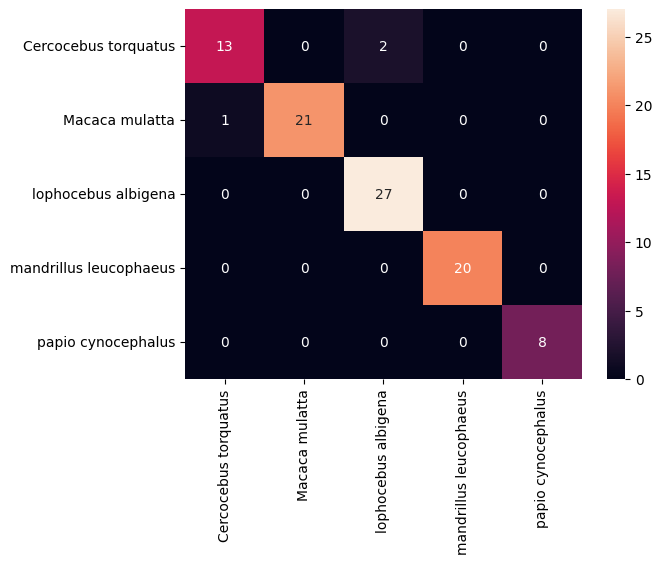

In [49]:
evalc(model, mask4)

In [21]:
for i in range(1, 6):
    print(i, np.sum(np.array(globals()[f"mask{i}"], dtype = int))/len(globals()[f"mask{i}"]))


1 0.4166666666666667
2 0.5
3 0.4305555555555556
4 0.4722222222222222
5 0.4722222222222222


In [23]:
np.sum(np.array(globals()[f"mask{2}"], dtype = int))

36

In [24]:
len(globals()[f"mask{2}"])

72

<BarContainer object of 72 artists>

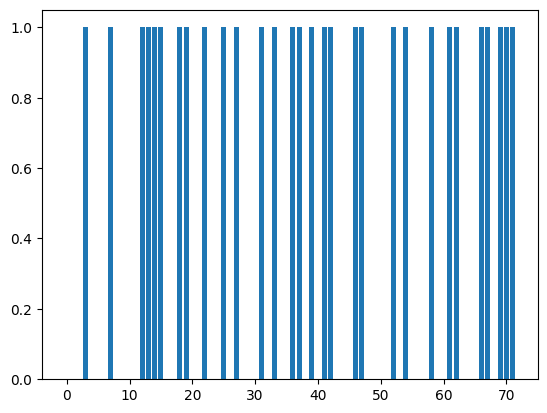

In [22]:
plt.bar(np.arange(len(mask1)), np.array(mask1, dtype = int))

# Plots 

In [41]:
def evalc(clf):

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []
    yp = []

    for train, test in cv.split(Xs, y):

        mask = np.ones(len(y[train]), dtype = bool)
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False

        clf.fit(Xs[train][mask], encoder.transform(y[train][mask]))

        mask = np.ones(len(y[test]), dtype = bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False

        #print(clf.predict(Xs[test][mask]))
        pred = encoder.inverse_transform(clf.predict(Xs[test][mask]))

        yt.append(y[test][mask])
        yp.append(pred)
        #print(np.unique(pred), np.unique(y[test][mask]))

    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    #print(len(yt), len(yp))

    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    #sns.heatmap(confusion_matrix(yt, yp), annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

    #print(yt, yp)
    #print(prpca.encoder.inverse_transform(np.unique(yt)))
    
    return(yt, yp, x_axis_labels)

def eval():
    KNNc =  KNeighborsClassifier(n_neighbors=2)
    LRc = LogisticRegression(C= 100, penalty= 'l1', solver= 'saga')
    kernel = 1.0 * RBF(1.0)
    model = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPc = GaussianProcessClassifier(kernel=kernel, random_state=0)
    SVc = SVC(gamma = 'auto', C = 100, kernel='linear')
    RFc = RandomForestClassifier(max_depth = 5, n_estimators = 50)
    ETc = ExtraTreesClassifier(max_depth = 9, n_estimators = 100)
    XGBc = XGBClassifier(max_depth = 3, n_estimators = 50)
    models = [KNNc, LRc, GPc, SVc, RFc, ETc, XGBc]

    yt = []
    yp = []
    xl = []
    for i in models:
        ytt, ypt, x_axis_labels = evalc(i)
        yt.append(ytt)
        yp.append(ypt)
        xl.append(x_axis_labels)

    #print(i, accuracy_score(ytt, ypt), balanced_accuracy_score(ytt, ypt))

    return yt, yp, xl

In [42]:
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('PCA_all.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

In [43]:
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('extreme_case#2_1_2_3_4_14.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus49.89
25
mandrillusleucophaeus49.89
Macacamulattaf80.246
29
Macacamulattaf80.246
Macacamulattam?sex1989.309
30
Macacamulattam?sex1989.309
Macacamulattam15.5.5.3
33
Macacamulattam15.5.5.3
Macacamulattaf31.1.11.26
35
Macacamulattaf31.1.11.26
Macacamulattaf15.5.5.5
45
Macacamulattaf15.5.5.5
Macacamulattaf15.5.5.8
47
Macacamulattaf15.5.5.8
Macacamulattam10.10.19.5
50
Macacamulattam10.10.19.5
lophocebusalbigena49.712
51
lophocebusalbigena49.712
lophocebusalbigena32.11.13.3
54
lophocebusalbigena32.11.13.3
lophocebusalbigena7.4.6.4
57
lophocebusalbigena7.4.6.4
lophocebusalbigena72.21
61
lophocebusalbigena72.21
lophocebusalb

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

In [381]:
dataf.shape

(94, 67)

In [382]:
prpca.removed

'0'

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
70 70
[3 3 2 2 2 2 1 1 1 1 1 0 0 1]
[1 3 2 2 2 2 1 1 1 1 1 0 0 0]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarnin

[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 1 1]
70 70


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
70 70
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
70 70


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 1]
[3 2 2 2 2 1 1 1 1 1 1 0 3 0]
[3 2 2 2 2 1 1 1 1 1 1 1 1 0]
70 70


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[3 3 2 2 2 2 1 1 1 1 1 0 0 0]
[2 3 2 2 2 2 1 1 1 1 1 0 0 1]
[3 2 2 2 2 1 1 1 1 1 1 0 0 0]
[3 2 2 2 2 1 1 1 1 1 1 0 0 1]
70 70


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


[3 3 2 2 2 2 1 0 1 1 1 0 0 0]
[3 3 2 2 2 3 1 1 1 1 1 0 0 0]
[2 3 2 2 2 2 1 1 1 1 1 0 0 1]
[3 2 2 2 2 1 1 1 1 1 1 0 0 1]
[3 2 2 2 2 1 1 1 1 1 1 0 1 0]
70 70
XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=50, n_jobs=0,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=0, ...) 0.9142857142857143 0.8969907407407407
lightskyblue
yellowgreen
tomato
khaki
[0 1 2 3]
lightskyblue
sandybrown
yellowgreen
tomato
kha

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
yellowgreen
tomato
khaki
[0 1 2 3]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


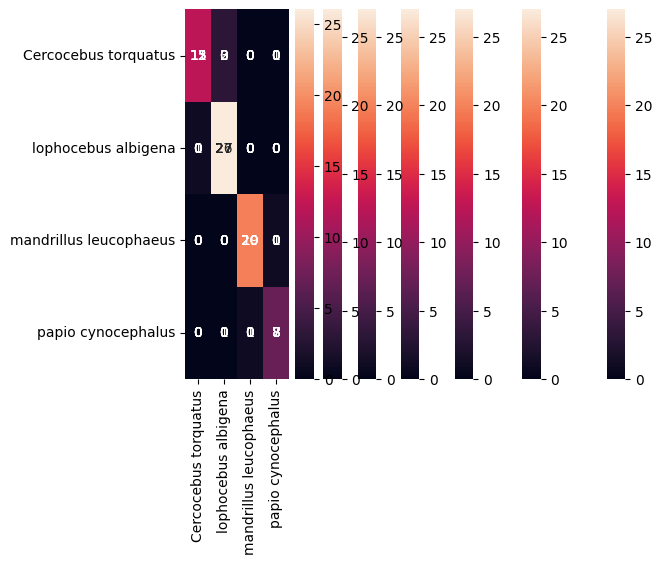

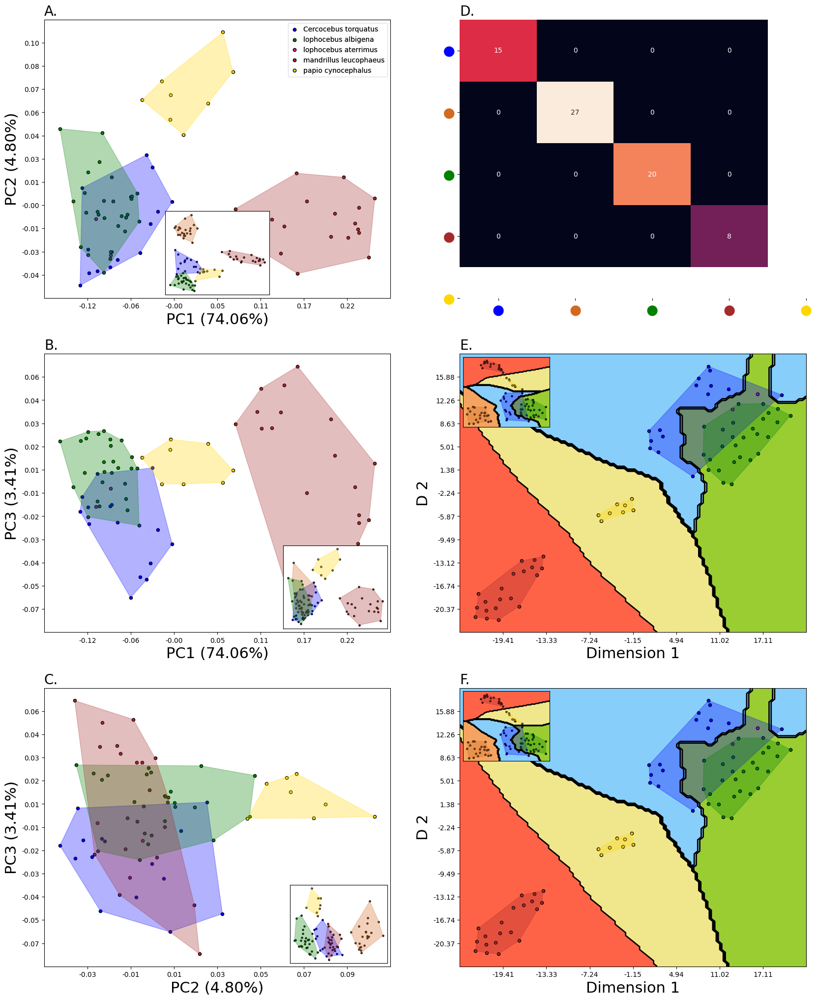

In [546]:
# Plotting the PCA and t-SNE plots together

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('without macaca mulatta.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

#arrow = mpatches.FancyArrowPatch((0.02, -0.06), (-0.0265, -0.051), color='red', edgecolor='black', mutation_scale=10)
#arrow = mpatches.FancyArrowPatch((0.02, 0.058), (-0.0318, 0.0552), color='red', edgecolor='black', mutation_scale=10)
#fig_axes[0,0].add_patch(arrow)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='lower center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#arrow = mpatches.FancyArrowPatch((-0.05, 0.01), (-0.0365, -0.0115), color='red', edgecolor='black', mutation_scale=10)
#arrow = mpatches.FancyArrowPatch((-0.04, -0.01), (-0.0343, 0.008), color='red', edgecolor='black', mutation_scale=10)
#fig_axes[2,0].add_patch(arrow)'
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="28%",
                        height="28%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False)

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("20")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("20")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

'''
inset_axest = inset_axes(fig_axes[0,1],
                        width="30%",
                        height="30%",
                        loc='upper center')
prpca_c.plot_tsne(method = None, index_r = 0, dlegend = False, ax = inset_axest, perplexity=40, ticks = False, size = 5, n_neighbors=5)
'''

prpca.plot_tsne(decision_boundary = True, cv = False, ax = fig_axes[1,1], n_r = 4, index_r = 0, perplexity=10)
fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,1],
                        width="25%",
                        height="25%",
                        loc='upper left')
prpca_c.plot_tsne(decision_boundary = True, cv = False, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)


prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=10)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='upper left')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)


plt.savefig('without macaca mulatta.svg', transparent = False, bbox_inches='tight')
plt.show()

ValueError: perplexity must be less than n_samples

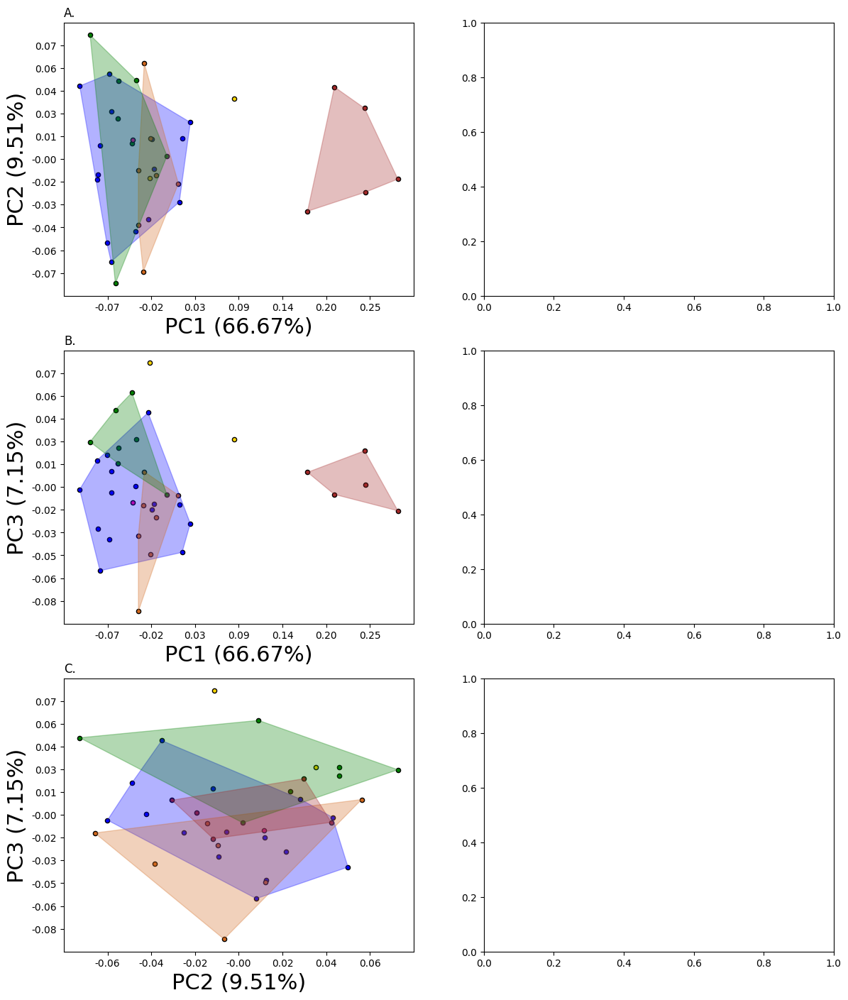

In [33]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(14,17))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = False, annote = False)
fig_axes[0,0].set_title('A.', fontsize = 12, loc = 'left')
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 12, loc = 'left')
prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)
fig_axes[2,0].set_title('C.', fontsize = 12, loc = 'left')
prpca.plot_tsne(method = 'lof', index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=40, n_neighbors=5)
fig_axes[0,1].set_title('D.', fontsize = 12, loc = 'left')
prpca.plot_tsne(decision_boundary = True, cv = False, ax = fig_axes[1,1], n_r = 4, index_r = 0, perplexity=40)
fig_axes[1,1].set_title('E.', fontsize = 12, loc = 'left')
prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=40)
fig_axes[2,1].set_title('F.', fontsize = 12, loc = 'left')

plt.savefig('cercocebus torquatus and papio cynocephalus manipulation2.svg', transparent = True)
plt.show()

# Inspecting and definig colours for dendrogram branches

In [24]:
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('all without 23, 24, 25, 26, 27.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

24
25
21
26
27
22
11
23
8
19
16
18
17
15
20
9
14
10
12
13
36
41
29
37
32
38
28
42
48
34
39
45
40
47
43
44
46
33
30
31
35
49
6
1
4
5
7
2
0
3
76
93
63
77
54
75
51
55
53
72
65
62
64
50
66
67
68
57
60
59
73
52
69
56
58
70
71
92
83
85
91
84
89
61
88
74
78
87
90
80
81
86
79
82


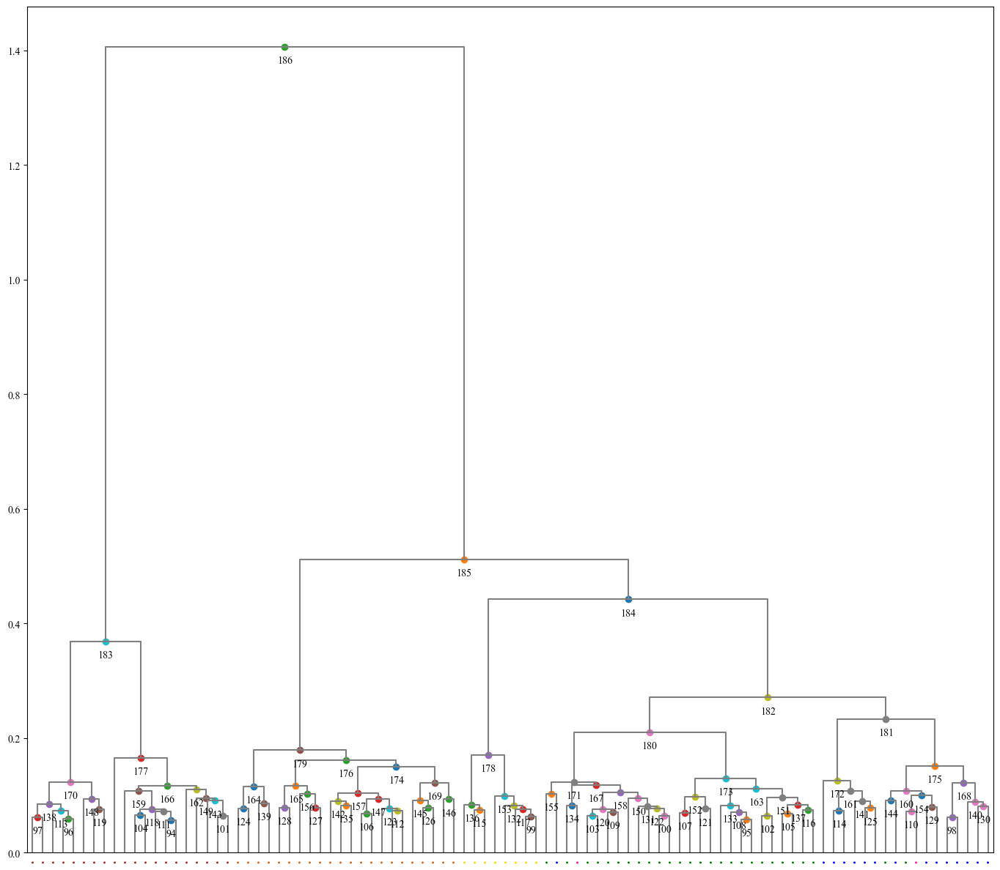

In [25]:
# Dendrogram
fig, fig_axes = plt.subplots(figsize=(17,15))


num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 16, ax = fig_axes, color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes.get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        print(l_e)
        #print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        #tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        #tick_label.set_fontsize("4")


# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

for posi in coord:
        x = 0.5 * sum(posi[0:2])
        y = posi[2]


        fig_axes.scatter(x, y)
        fig_axes.annotate("%2i" % num, (x, y), xytext=(0, -8),
                        textcoords='offset points',
                        va='top', ha='center')
        num = num+1

fig_axes.set_xticklabels(circle_labels)

plt.savefig('dendro.svg')
plt.show()

labs = np.array(labs)

In [634]:
labs

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 5, 5,
       5, 5, 5, 5, 5, 5, 0, 0, 0, 0, 0, 0, 3, 0, 2, 2, 3, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2])

In [638]:
np.where(labs == 0)

(array([50, 51, 52, 53, 54, 55, 57], dtype=int64),)

In [429]:
20,
42, 49
79, 85
50, 78
86

(14, 42, 50, 77)

In [639]:
color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42  + 5:
                color[num] = 'chocolate'
        if x2 >= 10*42 + 5 and x2 < 10*50  + 5:
                color[num] = 'gold'
        if x2 >= 10*50 + 5 and x2 < 10*56 + 5:
                color[num] = 'blue'
        if x2 > 10*56 + 5:
                color[num] = 'green'

        if num > 143:
                color[num] = 'gray'

        num = num+1

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
5
5
5
5
5
5
5
5
0
0
0
0
0
0
3
0
2
2
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2


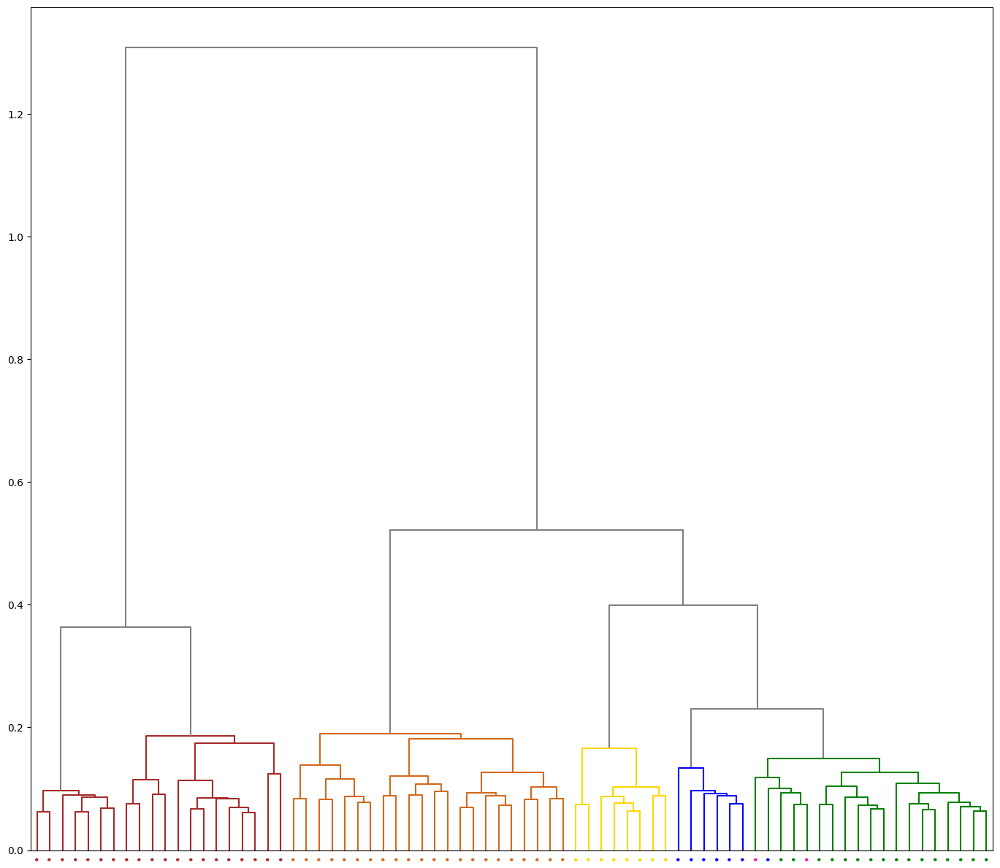

In [640]:
# Dendrogram
fig, fig_axes = plt.subplots(figsize=(17,15))


num = len(prpca.GPApt)

d = plot_dendrogram(p = 15, ax = fig_axes, color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes.get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("4")
        #link_colour[i] = colours[l_e]


# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]


fig_axes.set_xticklabels(circle_labels)

plt.savefig('dendro.svg')
plt.show()

labs = np.array(labs)

In [587]:
len(prpca.GPApt)

83

In [588]:
color

['gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'gray',
 'blue',
 'brown',
 'brown',
 'brown',
 'green',
 'gold',
 'green',
 'brown',
 'green',
 'brown',
 'brown',
 'chocolate',
 'green',
 'green',
 'chocolate',
 'green',
 'green',
 'gold',
 'blue',
 'blue',
 'brown',
 'green',
 'gold',
 'green',
 'chocolate

In [655]:
(15+22+16+20+8-3)/(15+22+16+20+8)

0.9629629629629629

In [654]:
41/(15+22+16+20+8)

0.5061728395061729

# Integrated plots

In [22]:
    from sklearn.cluster import AgglomerativeClustering
    from scipy.cluster.hierarchy import dendrogram
    def dendrogram_GPA(
        model,
        **kwargs):
        
        # The counts of samples under each node
        counts = np.zeros(model.children_.shape[0])
        n_samples = len(model.labels_)
        for i, merge in enumerate(model.children_):
            current_count = 0
            for child_idx in merge:
                if child_idx < n_samples:
                    # leaf node
                    current_count += 1  
                else:
                    current_count += counts[child_idx - n_samples]
            counts[i] = current_count

        linkage_matrix = np.column_stack(
            [model.children_, model.distances_, counts]
        ).astype(float)

        



        # Plot the corresponding dendrogram
        d = dendrogram(linkage_matrix,link_color_func=lambda x: color[x], **kwargs)

        return d

    # The dendrogram function
    def plot_dendrogram(
        **kwargs):

        # setting distance_threshold=0 ensures we compute the full tree.
        # Using agglomerative clustering
        model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)
        X = prpca.GPApt
        model = model.fit(X)
        # plot the top three levels of the dendrogram
        d = dendrogram_GPA(model,**kwargs, truncate_mode="level")

        return d


In [274]:
def evalc(i, clf):

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=72)
    
    yt = []
    yp = []

    for train, test in cv.split(Xs, y):

        mask = np.ones(len(y[train]), dtype = bool)
        delet = np.where(y0[train] == 'lophocebus aterrimus')
        mask[delet] = False
        delet = np.where(y0[train] == deletg)
        mask[delet] = False

        if i < 7:
            clf.fit(Xs[train][mask], encoder.transform(y[train][mask]))
        elif i == 7:
            clf.fit(X3[train][mask], encoder.transform(y[train][mask]))     
        else:
            clf.fit(X10[train][mask], encoder.transform(y[train][mask]))

        mask = np.ones(len(y[test]), dtype = bool)
        delet = np.where(y0[test] == 'lophocebus aterrimus')
        mask[delet] = False

        if i < 7:
            pred = encoder.inverse_transform(clf.predict(Xs[test][mask]))
        elif i == 7: 
            pred = encoder.inverse_transform(clf.predict(X3[test][mask]))   
        else:
            pred = encoder.inverse_transform(clf.predict(X10[test][mask]))
            

        yt.append(y[test][mask])
        yp.append(pred)
        #print(np.unique(pred), np.unique(y[test][mask]))

    yt = np.array(np.concatenate(yt))
    yp = np.array(np.concatenate(yp))

    #print(len(yt), len(yp))

    x_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))
    y_axis_labels = prpca.encoder.inverse_transform(np.unique(yt))

    #sns.heatmap(confusion_matrix(yt, yp), annot=True, xticklabels=x_axis_labels, yticklabels=y_axis_labels)

    #print(yt, yp)
    #print(prpca.encoder.inverse_transform(np.unique(yt)))
    
    return(yt, yp, x_axis_labels)

def eval():
    KNNc =  KNeighborsClassifier(n_neighbors=2)
    LRc = LogisticRegression(C= 100, penalty= 'l1', solver= 'saga')
    kernel = 1.0 * RBF(1.0)
    model = GaussianProcessClassifier(kernel=kernel, random_state=0)
    GPc = GaussianProcessClassifier(kernel=kernel, random_state=0)
    SVc = SVC(gamma = 'auto', C = 100, kernel='linear')
    RFc = RandomForestClassifier(max_depth = 5, n_estimators = 50)
    ETc = ExtraTreesClassifier(max_depth = 9, n_estimators = 100)
    XGBc = XGBClassifier(max_depth = 3, n_estimators = 50)
    lda3 = LinearDiscriminantAnalysis(n_components=2)
    lda10 = LinearDiscriminantAnalysis(n_components=2)
    models = [KNNc, LRc, GPc, SVc, RFc, ETc, XGBc, lda3, lda10]

    yt = []
    yp = []
    xl = []
    for i, h in enumerate(models):
        ytt, ypt, x_axis_labels = evalc(i, h)
        yt.append(ytt)
        yp.append(ypt)
        xl.append(x_axis_labels)

    #print(i, accuracy_score(ytt, ypt), balanced_accuracy_score(ytt, ypt))

    return yt, yp, xl

In [275]:
def addarrow(ind, ind1, ind2, ax, rotate = 0):
    ax = ax
    ind = ind
    ind1 = ind1 - 1
    ind2 = ind2 - 1

    start, end = ax.get_xlim()
    stepx = (end-start)/10
    start, end = ax.get_ylim()
    stepy = (end-start)/10

    x = prpca.x

    xt = x[ind, ind1]-stepx
    yt = x[ind, ind2]+stepy

    if rotate != 0:
                
        rotate = rotate*(np.pi)/180

        s = np.sin(rotate)
        c = np.cos(rotate)

        xt -= x[ind, ind1]
        yt -= x[ind, ind2]

        xnew = xt*c - yt*s
        ynew = xt*s + yt*c

        xt = xnew + x[ind, ind1]
        yt = ynew + x[ind, ind2]

    arrow = mpatches.FancyArrowPatch((xt, yt), (x[ind, ind1], x[ind, ind2]),
        color='red', edgecolor='black', mutation_scale=10)
    
    ax.add_patch(arrow)


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
3
2
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
5
5
5
5
5
5
5
5


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


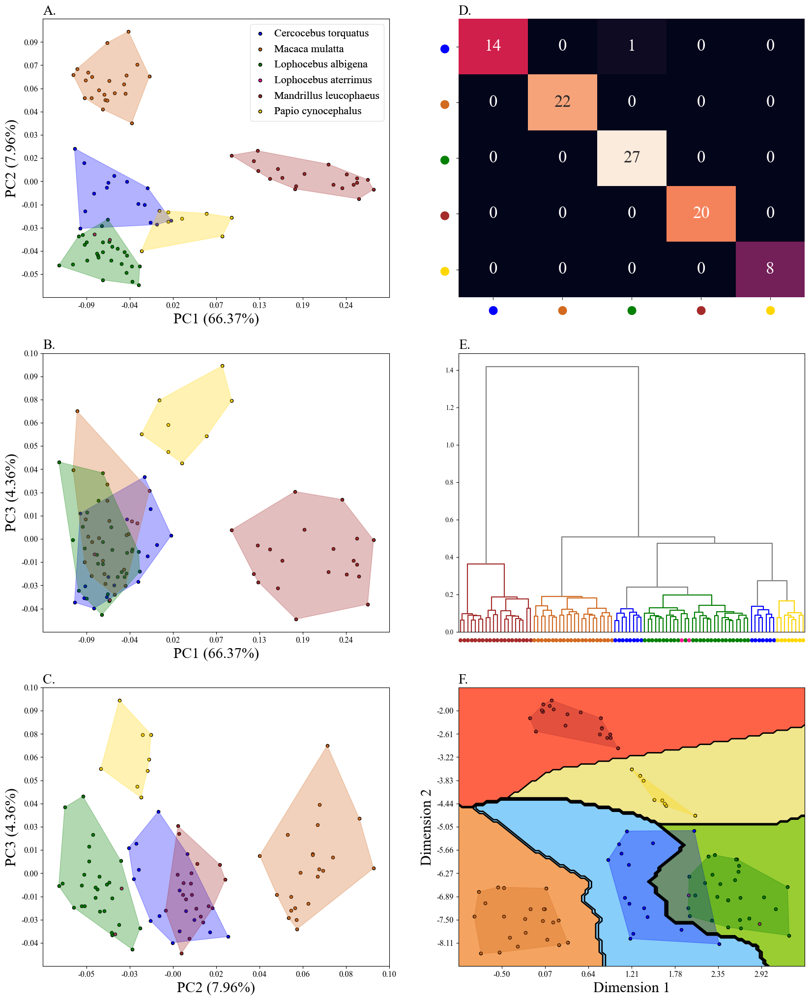

In [283]:
####################################################################################################################################
##                                                                    all                                                         ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('PCA_all.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42 + 5:
                color[num] = 'chocolate'
        if (x2 >= 10*42 + 5 and x2 < 10*50  + 5) or (x2 >= 10*79 + 5 and x2 < 10*86  + 5):
                color[num] = 'blue'
        if x2 >= 10*50 + 5 and x2 < 10*80 + 5:
                color[num] = 'green'
        if x2 > 10*85 + 5:
                color[num] = 'gold'

        if num > 183:
                color[num] = 'gray'

        color[181] = 'gray'
        color[182] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)
fig_axes[1,1].tick_params(axis='x', which='major', labelsize=40)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=50, n_neighbors=5)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')

#plt.rcParams["font.family"] = "serif"
#plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('PCA_all.svg', transparent = False, bbox_inches='tight')
plt.show()

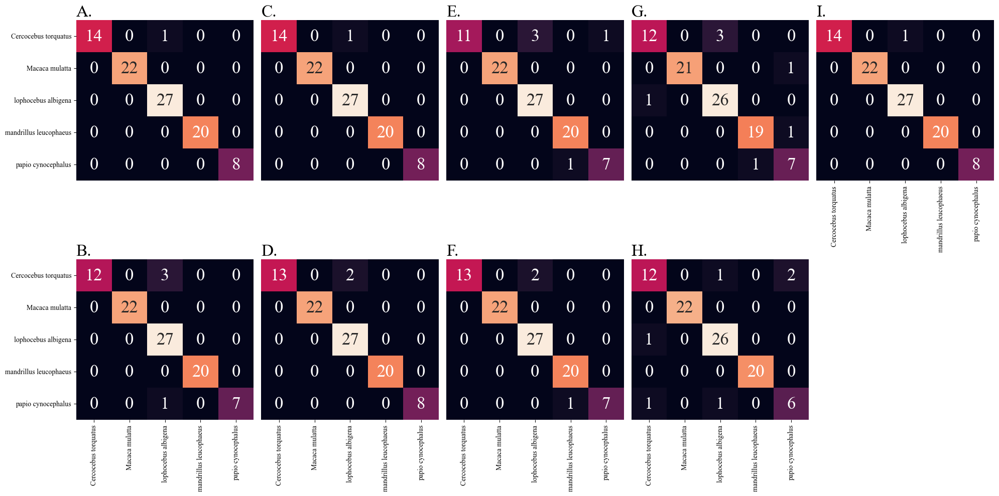

In [284]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_all.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [285]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

90.03125236749686
(94, 86)
0.9347826086956522 0.9025925925925925
0.9891304347826086 0.9866666666666667


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
5
5
5
5
5
5
5
5
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
0
0
0
0
0
0
0
0
0
0
0
3
0
0
3
0
0
lightskyblue
sandybrown
tomato
khaki
[0 1 2 3]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


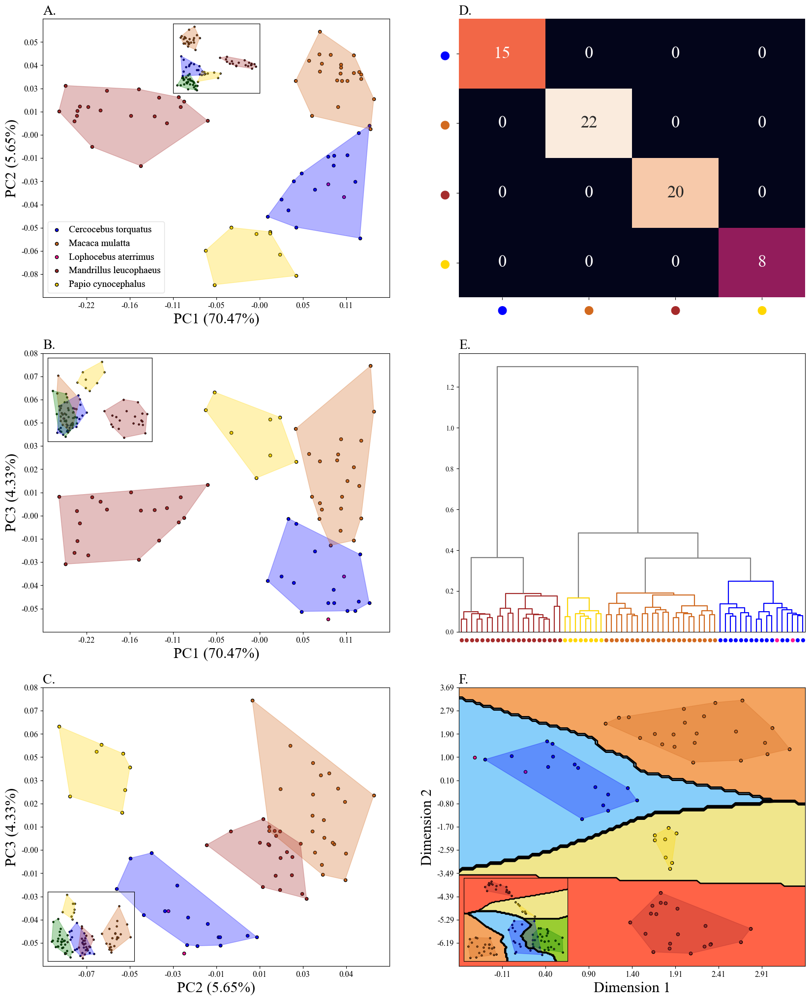

In [288]:
####################################################################################################################################
##                                                    without lophocebus albigena                                                 ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('without lophocebus albigena.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

#circle_labels = ['●','●','●','●','●']
circle_labels = ['●','●','●','●']
#colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
colours = ['blue', 'chocolate', 'brown', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=14)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="25%", # width = 30% of parent_bbox
                        height="25%",
                        loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="25%",
                        height="25%",
                        loc='lower left')
inset_axest.patch.set_alpha(0.35)

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*28 + 5:
                color[num] = 'gold'
        if x2 >= 10*28 + 5 and x2 < 10*50  + 5:
                color[num] = 'chocolate'
        if x2 >= 10*50 + 5:
                color[num] = 'blue'

        if num > 128:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="30%",
                        height="30%",
                        loc='lower left')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('without lophocebus albigena.svg', transparent = False, bbox_inches='tight')
plt.show()

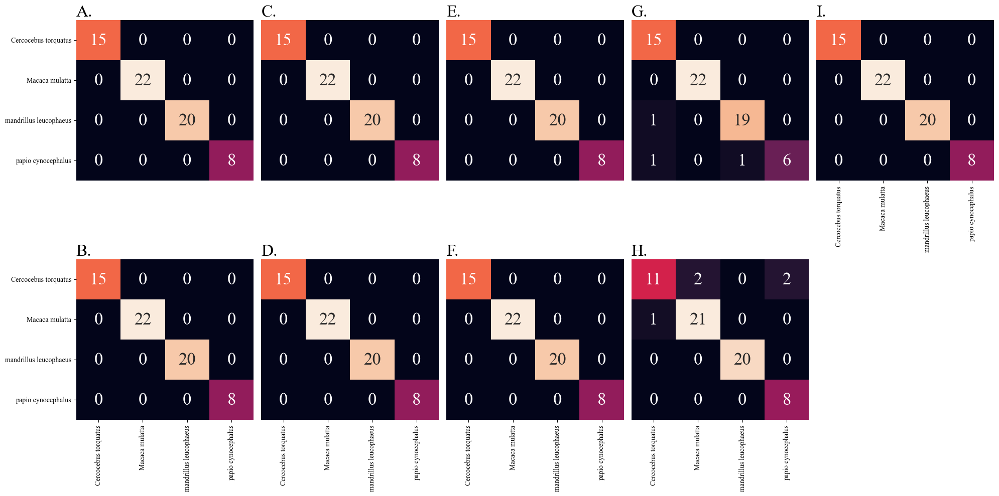

In [289]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_without lophocebus albigena.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [290]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

91.59743137686839
(67, 66)
0.9230769230769231 0.921969696969697
1.0 1.0


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
0
0
0
0
0
0
0
0
2
2
2
2
2
2
2
2
2
2
3
2
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
0
5
5
5
5
5
5
5
5


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
yellowgreen
tomato
khaki
[0 1 2 3]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


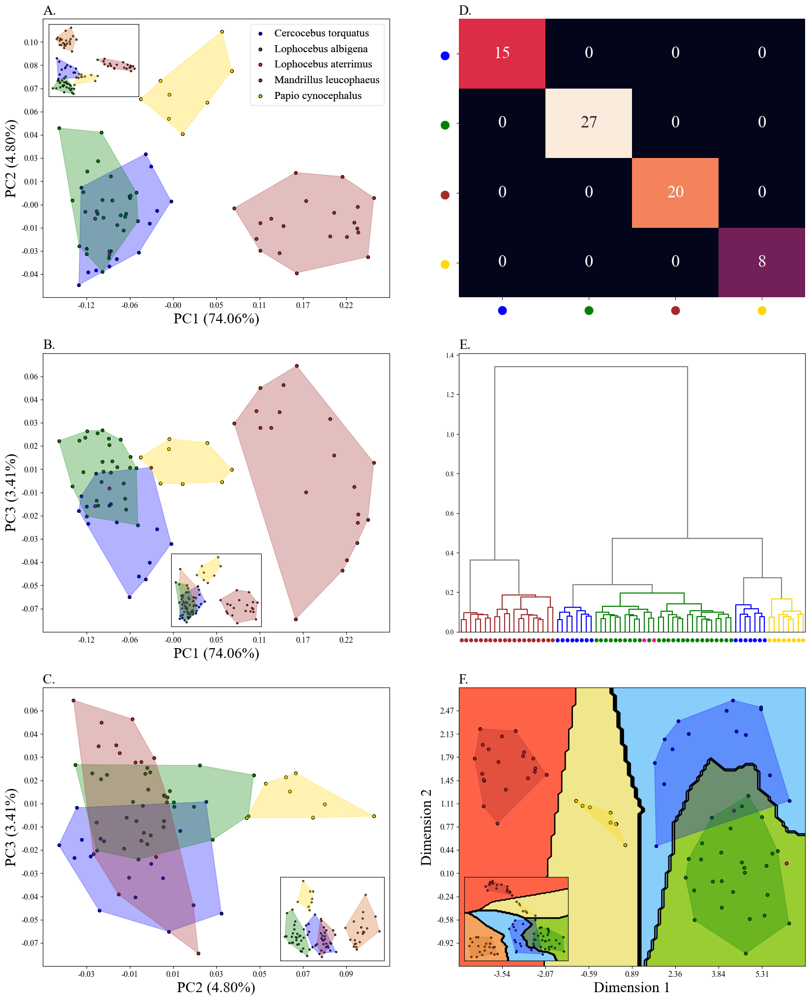

In [294]:
####################################################################################################################################
##                                                   without without macaca mulatta                                               ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('without macaca mulatta.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

#circle_labels = ['●','●','●','●','●']
circle_labels = ['●','●','●','●']
#colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
colours = ['blue', 'green', 'brown', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="26%", # width = 30% of parent_bbox
                        height="26%",
                        loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="26%",
                        height="26%",
                        loc='lower center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if (x2 >= 10*20 + 5 and x2 < 10*28  + 5) or (x2 >= 10*57 + 5 and x2 < 10*64  + 5):
                color[num] = 'blue'
        if x2 >= 10*28 + 5 and x2 < 10*57 + 5:
                color[num] = 'green'
        if x2 > 10*64 + 5:
                color[num] = 'gold'

        if num > 137:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="30%",
                        height="30%",
                        loc='lower left')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('without macaca mulatta.svg', transparent = False, bbox_inches='tight')
plt.show()

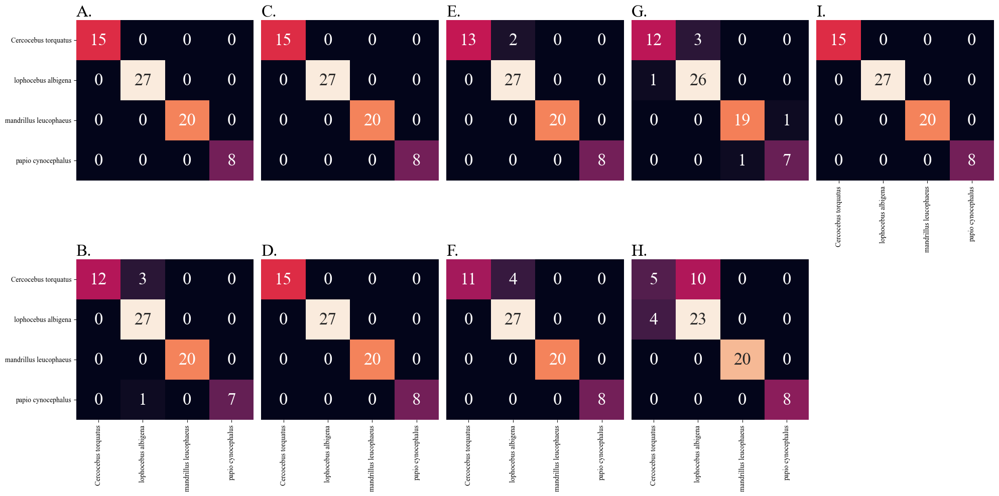

In [295]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_without macaca mulatta.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [297]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

91.72871374516285
(72, 71)
0.8 0.7962962962962963
1.0 1.0


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
5
5
5
5
5
5
5
5
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
2
2
2
2
2
2
3
2
2
2
3
2
2
2
2
2
2
2
lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


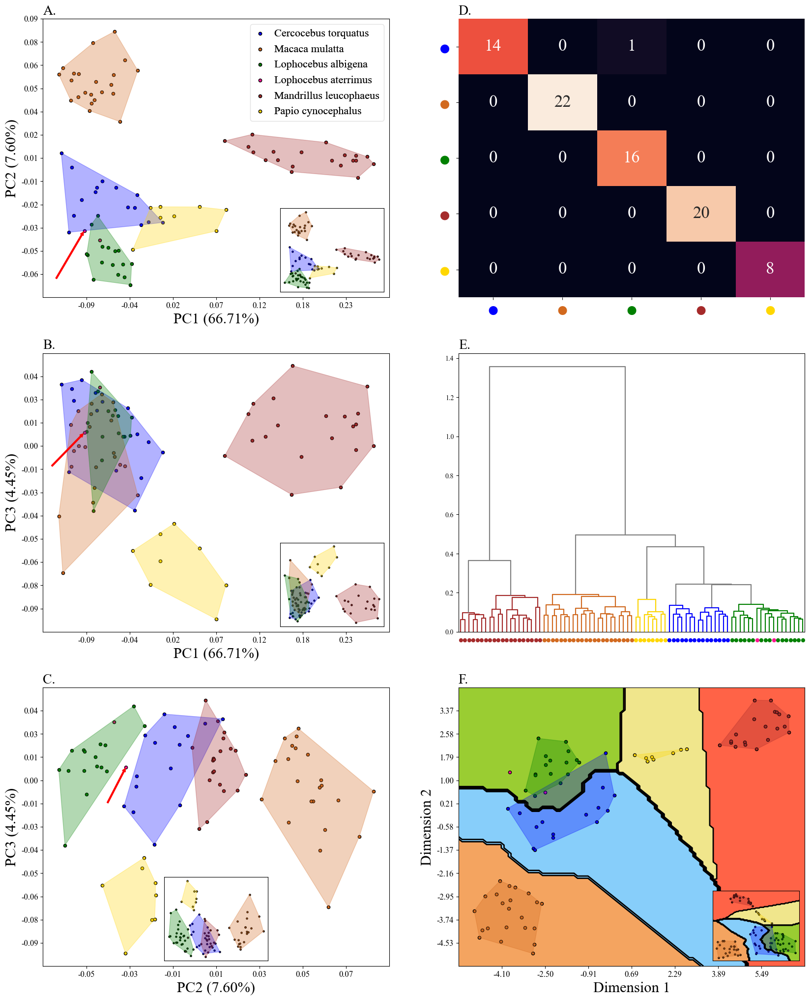

In [298]:
####################################################################################################################################
##                                                        lophocebus albigena #2                                                  ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('lophocebus albigena #2.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')

addarrow(ind = 66, ind1 = 1, ind2 = 2, ax = fig_axes[0,0], rotate = 60)


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')

addarrow(ind = 66, ind1 = 1, ind2 = 3, ax = fig_axes[1,0], rotate = 45)


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

addarrow(ind = 66, ind1 = 2, ind2 = 3, ax = fig_axes[2,0], rotate = 110)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='lower center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42  + 5:
                color[num] = 'chocolate'
        if x2 >= 10*42 + 5 and x2 < 10*50  + 5:
                color[num] = 'gold'
        if x2 >= 10*50 + 5 and x2 < 10*65 + 5:
                color[num] = 'blue'
        if x2 > 10*64 + 5:
                color[num] = 'green'

        if num > 158:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='lower right')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('lophocebus albigena #2.svg', transparent = False, bbox_inches='tight')
plt.show()

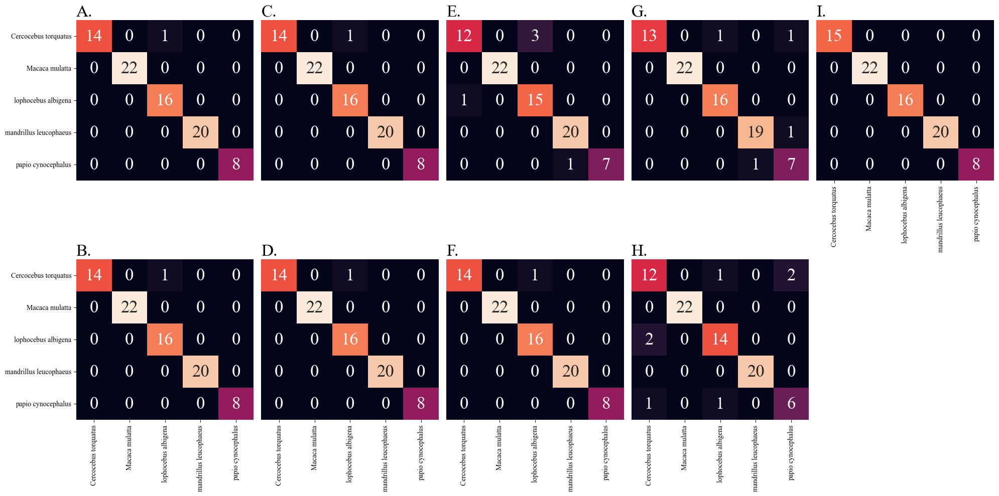

In [299]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_lophocebus albigena #2.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [300]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

90.38592325378076
(83, 82)
0.9135802469135802 0.885
1.0 1.0


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
5
5
5
5
5
5
5
5
0
0
0
0
0
0
3
0
2
2
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


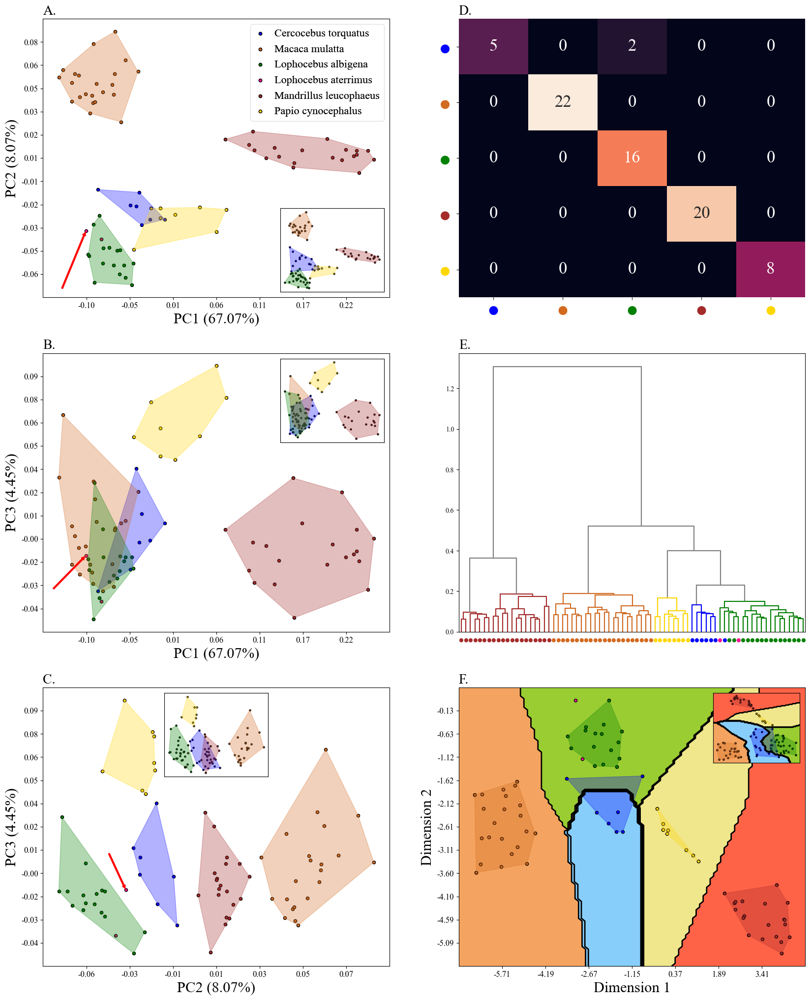

In [301]:
####################################################################################################################################
##                                  cercocebus torquatus and lophocebus albigena manipulation1                                    ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('cercocebus torquatus and lophocebus albigena manipulation1.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')

addarrow(ind = 66, ind1 = 1, ind2 = 2, ax = fig_axes[0,0], rotate = 70)


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')

addarrow(ind = 66, ind1 = 1, ind2 = 3, ax = fig_axes[1,0], rotate = 45)


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

addarrow(ind = 66, ind1 = 2, ind2 = 3, ax = fig_axes[2,0], rotate = -25)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42  + 5:
                color[num] = 'chocolate'
        if x2 >= 10*42 + 5 and x2 < 10*50  + 5:
                color[num] = 'gold'
        if x2 >= 10*50 + 5 and x2 < 10*56 + 5:
                color[num] = 'blue'
        if x2 > 10*56 + 5:
                color[num] = 'green'

        if num > 143:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='upper right')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('cercocebus torquatus and lophocebus albigena manipulation1.svg', transparent = False, bbox_inches='tight')
plt.show()

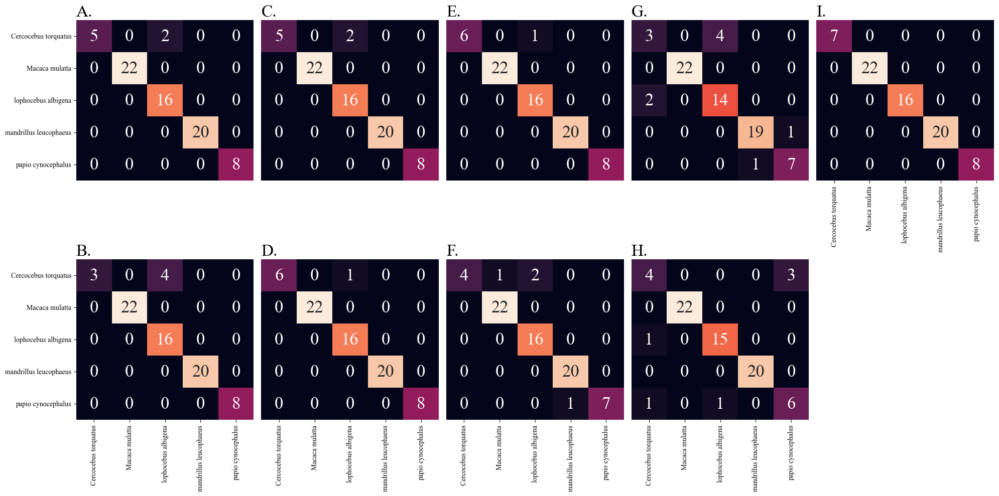

In [302]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_cercocebus torquatus and lophocebus albigena manipulation1.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [303]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

90.91044370959298
(75, 74)
0.9178082191780822 0.8517857142857143
1.0 1.0


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
5
5
5
5
5
5
5
5
2
0
2
3
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
0
0
0
0
0
0
2
0
2
3
0
0
0
0
0
0
0


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


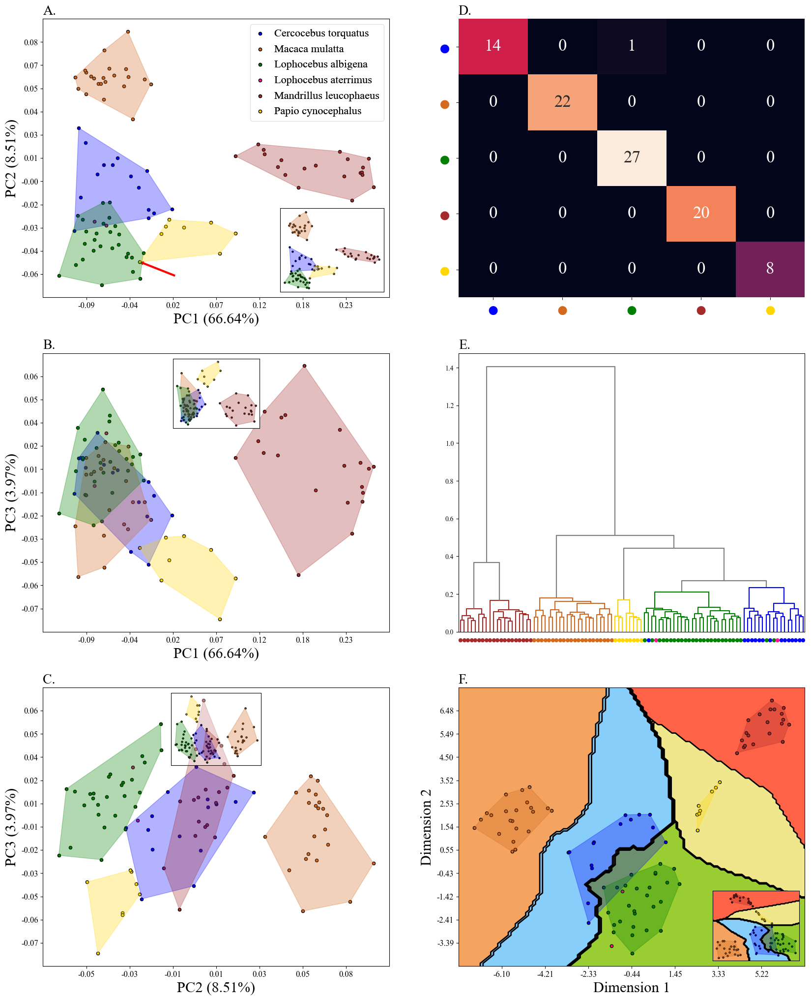

In [304]:
####################################################################################################################################
##                                                   all without 23, 24, 25, 26, 27                                               ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('all without 23, 24, 25, 26, 27.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

arrow = mpatches.FancyArrowPatch((0.02, -0.06), (-0.0265, -0.051), color='red', edgecolor='black', mutation_scale=10)

fig_axes[0,0].add_patch(arrow)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='lower right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="25%",
                        height="25%",
                        loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="26%",
                        height="26%",
                        loc='upper center')
inset_axest.patch.set_alpha(0.35)

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'brown'
        if x2 >= 10*20 + 5 and x2 < 10*42 + 5:
                color[num] = 'chocolate'
        if x2 >= 10*42 + 5 and x2 < 10*50  + 5:
                color[num] = 'gold'
        if x2 >= 10*50 + 5 and x2 < 10*77 + 5:
                color[num] = 'green'
        if x2 > 10*77 + 5:
                color[num] = 'blue'

        if num > 181:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='lower right')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('all without 23, 24, 25, 26, 27.svg', transparent = False, bbox_inches='tight')
plt.show()

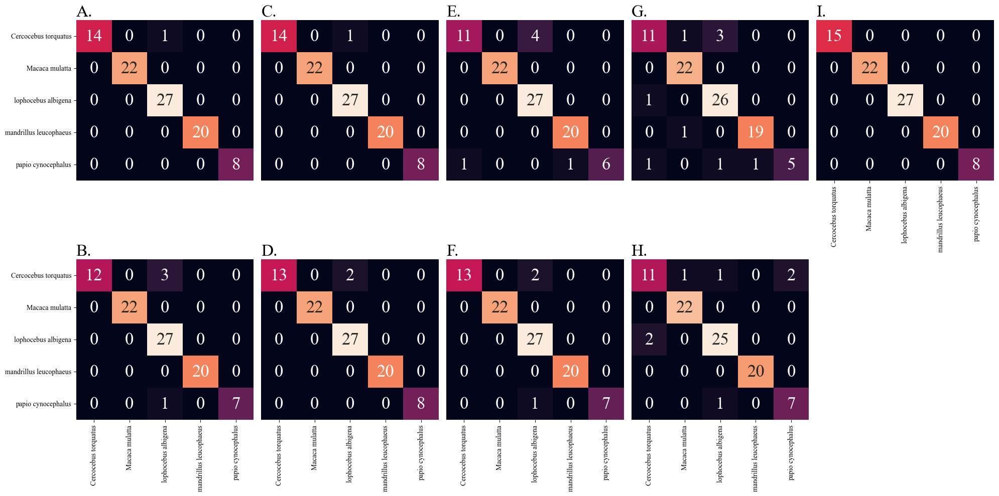

In [305]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_all without 23, 24, 25, 26, 27.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [306]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

90.36301608810177
(94, 71)
0.9239130434782609 0.906851851851852
1.0 1.0


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
4
0
2
3
2
2
2
2
2
2
2
2
2
2
2
0
2
2
2
2
2
2
2
2
2
2
2
2
3
0
2
2
2
0
0
0
0
0
0
0
0
0
0
0
1
0
5
5
5
5
5
5
5
5
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


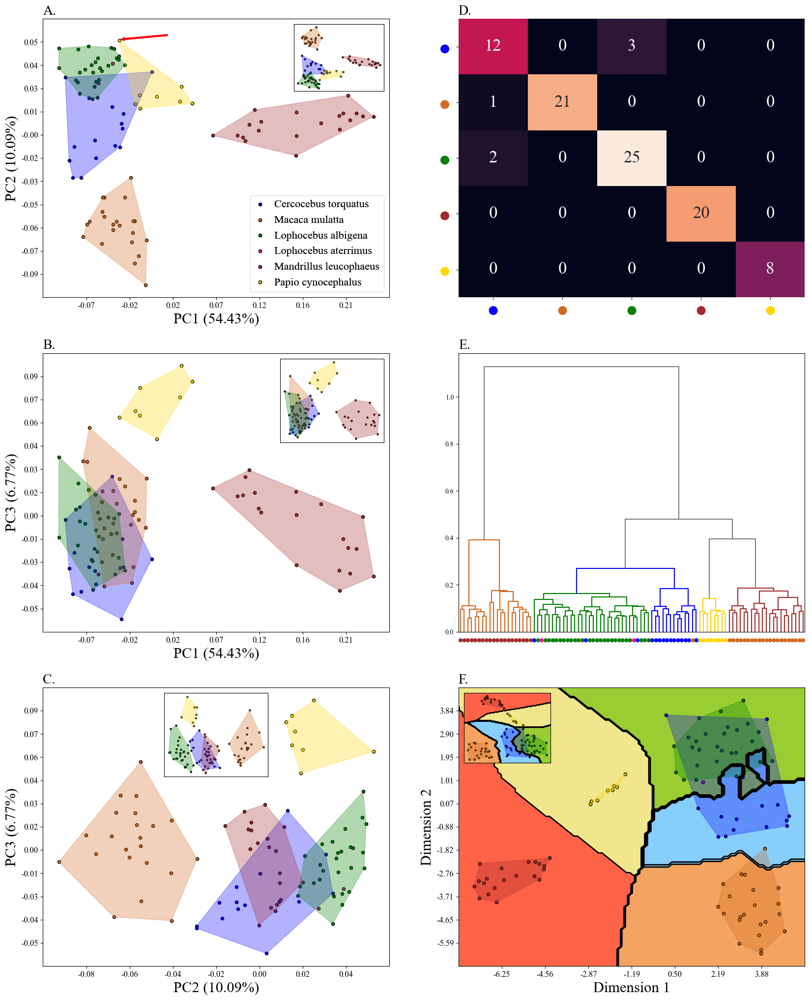

In [307]:
####################################################################################################################################
##                                           all without 11, 12, 16, 17, 18, 30, 31                                               ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('all without 11, 12, 16, 17, 18, 30, 31.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

#arrow = mpatches.FancyArrowPatch((0.02, -0.06), (-0.0265, -0.051), color='red', edgecolor='black', mutation_scale=10)
arrow = mpatches.FancyArrowPatch((0.02, 0.058), (-0.0318, 0.0552), color='red', edgecolor='black', mutation_scale=10)
fig_axes[0,0].add_patch(arrow)
prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="26%", # width = 30% of parent_bbox
                        height="24%",
                        loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='upper center')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)


# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]


x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*20 + 5:
                color[num] = 'chocolate'
        if x2 >= 10*20 + 5 and x2 < 10*52 + 5:
                color[num] = 'green'
        if x2 >= 10*52 + 5 and x2 < 10*65  + 5:
                color[num] = 'blue'
        if x2 >= 10*65 + 5 and x2 < 10*73 + 5:
                color[num] = 'gold'
        if x2 > 10*73 + 5:
                color[num] = 'brown'

        if num > 183:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
        
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=30)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='upper left')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('all without 11, 12, 16, 17, 18, 30, 31.svg', transparent = False, bbox_inches='tight')
plt.show()

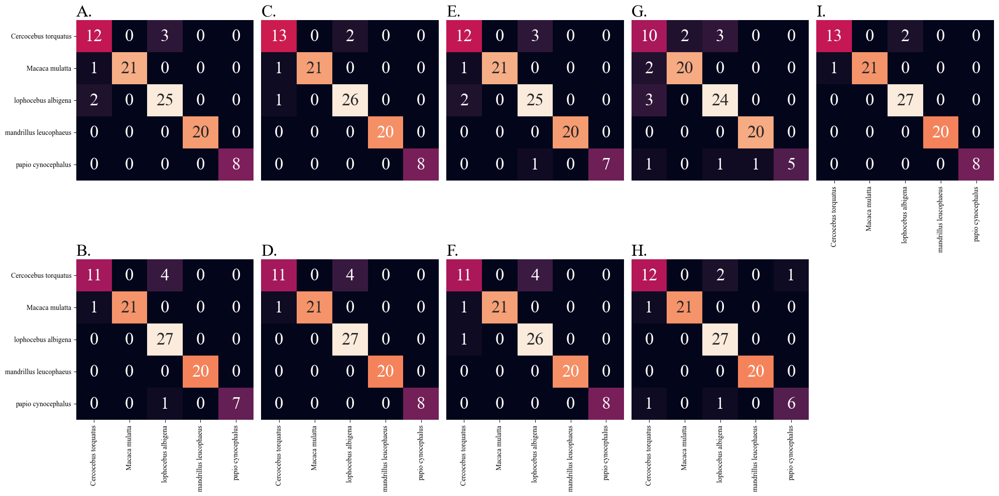

In [308]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')

fig.tight_layout()
plt.savefig('CM_all without 11, 12, 16, 17, 18, 30, 31.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [309]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

87.24806418330321
(94, 65)
0.9347826086956522 0.900909090909091
0.967391304347826 0.9642424242424242


papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.742
8
papiocynocephalus61.742
Macacamulattaf80.246
29
Macacamulattaf80.246
Macacamulattam31.1.11.22
31
Macacamulattam31.1.11.22
Macacamulattaf37.12.3.75
37
Macacamulattaf37.12.3.75
Macacamulattaf36.12.26.3
38
Macacamulattaf36.12.26.3
Macacamulattaf97.6.5.2
41
Macacamulattaf97.6.5.2
Macacamulattaf31.1.11.21
43
Macacamulattaf31.1.11.21
Macacamulattaf31.1.11.18
48
Macacamulattaf31.1.11.18
Macacamulattaf31.1.11.30
49
Macacamulattaf31.1.11.30
Macacamulattam10.10.19.5
50
Macacamulattam10.10.19.5
lophocebusalbigena54.760
53
lophocebusalbigena54.760
lophocebusalbigena32.11.13.3
54
lophocebusalbigena32.11.13.3
lophocebusalbigena30.8.1.28
58
lophocebusalbigena30.8.1.28
lophocebusalbigena30.8.1.24
59
lophocebusalbigena30.8.1.24
lophocebusalbigena30.8.1.25
63
lophocebusalbigena30.8.1.25
lophocebusalbigena34.6.3.2
65
lophocebusalbigena34.6.3.2
lophocebusalbigena73.826
70
lophocebu

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

2
2
2
2
2
0
2
2
1
5
2
5
2
2
3
1
3
1
1
1
1
1
1
0
1
0
2
0
5
0


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
[0 1 2]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


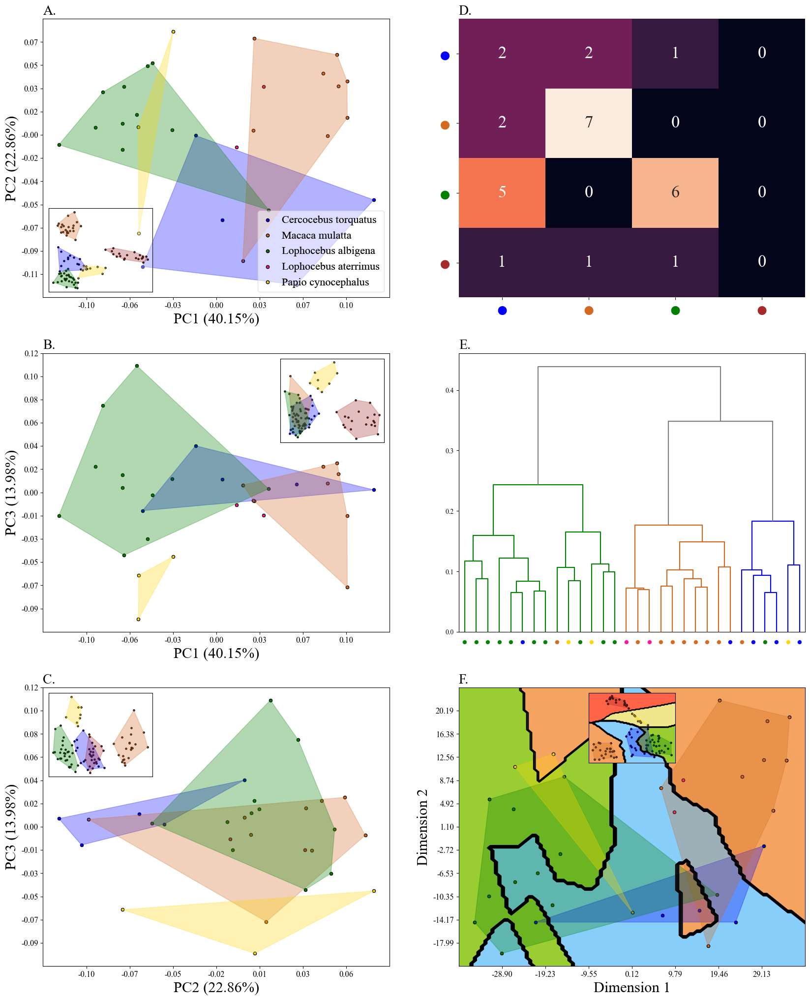

In [310]:
####################################################################################################################################
##                                                      Extreme_case#1_2_3_4_6_14                                                 ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('Extreme_case#1_2_3_4_6_14.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

#circle_labels = ['●','●','●','●','●']
circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='lower left')
inset_axest.patch.set_alpha(0.35)

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='upper right')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='upper left')
prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*14 + 5:
                color[num] = 'green'
        if x2 >= 10*14 + 5 and x2 < 10*24 + 5:
                color[num] = 'chocolate'
        if x2 > 10*24 + 5:
                color[num] = 'blue'

        if num > 56:
                color[num] = 'gray'

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=5)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='upper center')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('Extreme_case#1_2_3_4_6_14.svg', transparent = False, bbox_inches='tight')
plt.show()

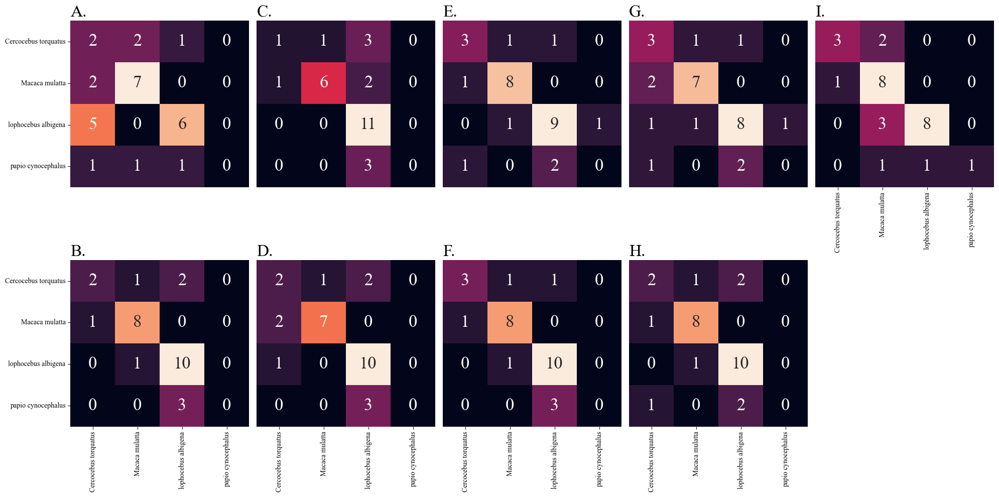

In [311]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')


fig.tight_layout()
plt.savefig('CM_Extreme_case#1_2_3_4_6_14.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [312]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

99.45375585083356
(30, 11)
0.7142857142857143 0.5494949494949495
0.7142857142857143 0.6373737373737375


papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus49.89
25
mandrillusleucophaeus49.89
Macacamulattaf80.246
29
Macacamulattaf80.246
Macacamulattam?sex1989.309
30
Macacamulattam?sex1989.309
Macacamulattam15.5.5.3
33
Macacamulattam15.5.5.3
Macacamulattaf31.1.11.26
35
Macacamulattaf31.1.11.26
Macacamulattaf15.5.5.5
45
Macacamulattaf15.5.5.5
Macacamulattaf15.5.5.8
47
Macacamulattaf15.5.5.8
Macacamulattam10.10.19.5
50
Macacamulattam10.10.19.5
lophocebusalbigena49.712
51
lophocebusalbigena49.712
lophocebusalbigena32.11.13.3
54
lophocebusalbigena32.11.13.3
lophocebusalbigena7.4.6.4
57
lophocebusalbigena7.4.6.4
lophocebusalbigena72.21
61
lophocebusalbigena72.21
lophocebusalb

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
c:\Users\edria\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: C

brown
brown
brown
brown
4
4
4
4
4
3
0
2
0
5
0
1
1
1
1
0
1
0
2
0
2
0
1
0
0
0
0
0
0
5
2
1
2
0
0
2
2


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
[0 1 2 3]


c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


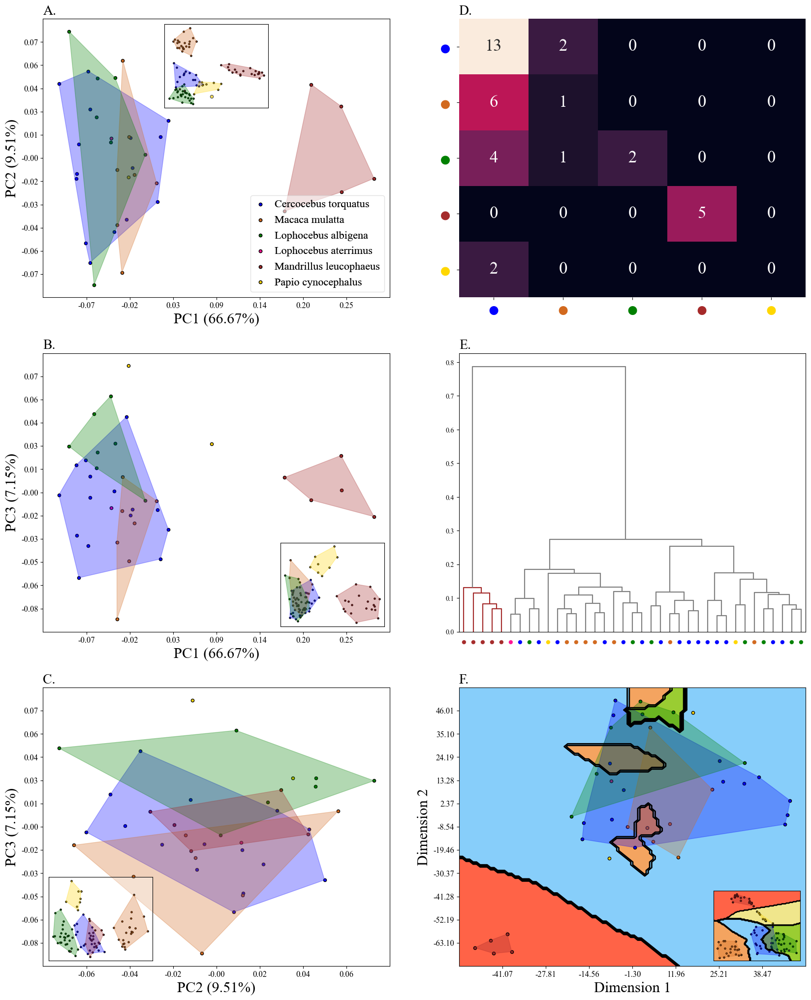

In [313]:
####################################################################################################################################
##                                                      extreme_case#2_1_2_3_4_14                                                 ##
####################################################################################################################################

prpca = procpca(df)
dataf, datag, ind, name = prpca.read('extreme_case#2_1_2_3_4_14.txt')
prpca_c = procpca(df)
dataf_c, datag_c, ind_c, name_c = prpca_c.read('PCA_all.txt')
Xs = prpca.GPApt
X3 = prpca.x[:, :2]
X10 = prpca.x[:, :10]
y = prpca.y
ys = prpca.ys
y0 = prpca.y0
deletg = prpca.deletg
len(np.where(y0 == 'lophocebus albigena')[0])
prpca.ys
encoder = LabelEncoder()
encoder.fit(ys)
encoder.transform(ys)
x_axis_labels = prpca.encoder.classes_.tolist() # labels for x-axis
y_axis_labels = prpca.encoder.classes_.tolist() # labels for y-axis
dataf.shape
yt, yp, xl = eval()

circle_labels = ['●','●','●','●','●']
#circle_labels = ['●','●','●','●']
colours = ['blue', 'chocolate', 'green', 'brown', 'gold']
#colours = ['blue', 'chocolate', 'green', 'gold']

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(20,25))

prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=2, ax = fig_axes[0,0], index_r = 0, dlegend = True, annote = False, legend_font_s=16)
fig_axes[0,0].set_title('A.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[0,0],
                        width="30%", # width = 30% of parent_bbox
                        height="30%",
                        loc='upper center')
inset_axest.patch.set_alpha(0.35)

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=2, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


prpca.PCAplotm(prpca.y, prpca.x, ind1=1, ind2=3, ax = fig_axes[1,0], index_r = 0, dlegend = False)
fig_axes[1,0].set_title('B.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[1,0],
                        width="30%",
                        height="30%",
                        loc='lower right')

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=1, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)

prpca.PCAplotm(prpca.y, prpca.x, ind1=2, ind2=3, ax = fig_axes[2,0], index_r = 0, dlegend = False)

fig_axes[2,0].set_title('C.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,0],
                        width="30%",
                        height="30%",
                        loc='lower left')
inset_axest.patch.set_alpha(0.35)

prpca_c.PCAplotm(prpca_c.y, prpca_c.x, ind1=2, ind2=3, ax = inset_axest, index_r = 0, dlegend = False, annote = False, ticks = False, size = 5)


#prpca.plot_tsne(method = None, index_r = 0, dlegend = True, ax = fig_axes[0,1], perplexity=10, n_neighbors=5)
sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,1], annot=True, xticklabels=circle_labels, yticklabels=circle_labels, cbar=False, annot_kws={'size':25})

for i, tick_label in enumerate(fig_axes[0,1].get_xticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

for i, tick_label in enumerate(fig_axes[0,1].get_yticklabels()):
        tick_label.set_color(colours[i])
        tick_label.set_fontsize("30")

fig_axes[0,1].set_title('D.', fontsize = 20, loc = 'left')

num = len(prpca.GPApt)
color = ['gray']*(2*num-1)  # initialize color list with blue

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

# add labels for nodes
coord = np.c_[np.array(d['icoord'])[:,1:3],np.array(d['dcoord'])[:,1]]
coord = coord[np.argsort(coord[:,2])]

color = ['gray']*(2*num-1)  # initialize color list with blue
num = len(prpca.GPApt)

x_l = []
for i, posi in enumerate(coord):
        x1 = posi[0]
        x2 = posi[1]
        if x1 not in x_l:
                x_l.append(x1)
        if x2 not in x_l:
                x_l.append(x2)

        if x2 < 10*5 + 5:
                color[num] = 'brown'
                print(color[num])

        num = num+1

d = plot_dendrogram(p = 15, ax = fig_axes[1,1], color_threshold=0.2)

circle_labels = []
for i in prpca.y:
        circle_labels.append('●')

colours = ['blue', 'chocolate', 'green', 'deeppink', 'brown', 'gold', 'black']

#link_colour = {}
labs = []

for i, tick_label in enumerate(fig_axes[1,1].get_xticklabels()):
        l_e = str(tick_label)[-4:-2]
        
        try:
                l_e = int(l_e)
        except:
                l_e = int(l_e[1:])

        #print(l_e)
        print(prpca.y[l_e])
        labs.append(prpca.y[l_e])

        tick_label.set_label('●')
        tick_label.set_color(colours[prpca.y[l_e]])
        tick_label.set_fontsize("14")
        #link_colour[i] = colours[l_e]
fig_axes[1,1].set_xticklabels(circle_labels)

fig_axes[1,1].set_title('E.', fontsize = 20, loc = 'left')



prpca.plot_tsne(decision_boundary = True, cv = True, ax = fig_axes[2,1], n_r = 4, index_r = 0, perplexity=5)
fig_axes[2,1].set_title('F.', fontsize = 20, loc = 'left')


inset_axest = inset_axes(fig_axes[2,1],
                        width="25%",
                        height="25%",
                        loc='lower right')
prpca_c.plot_tsne(decision_boundary = True, cv = True, ax = inset_axest, perplexity=50, ticks = False, size = 5, n_neighbors=5)

plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = ["Times New Roman"]
plt.savefig('extreme_case#2_1_2_3_4_14.svg', transparent = False, bbox_inches='tight')
plt.show()

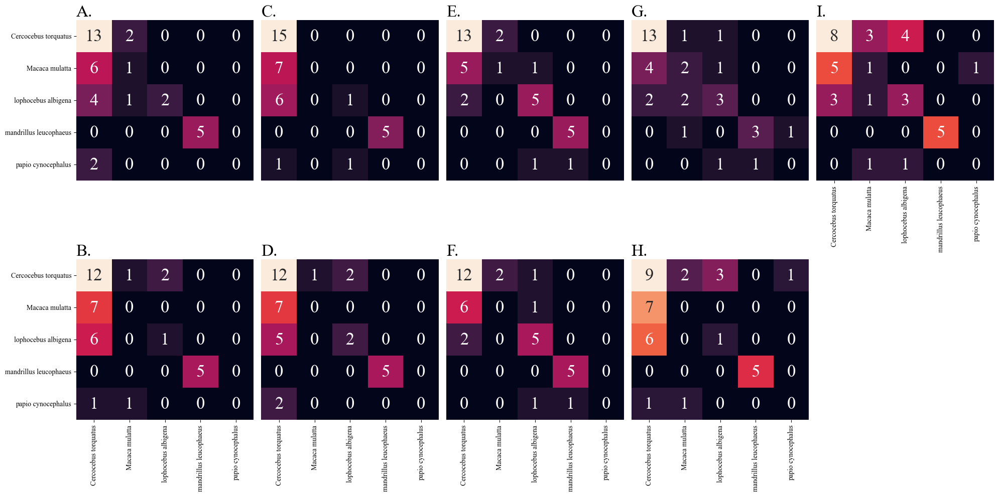

In [314]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=5, nrows=2, figsize=(20,10))

sns.heatmap(confusion_matrix(yt[0], yp[0]), ax = fig_axes[0,0], annot=True, yticklabels=xl[0], cbar=False, annot_kws={'size':25})
fig_axes[0,0].set_title('A.', fontsize = 24, loc = 'left')
fig_axes[0,0].set_xticks([])
sns.heatmap(confusion_matrix(yt[1], yp[1]), ax = fig_axes[1,0], annot=True, xticklabels=xl[1], yticklabels=xl[1], cbar=False, annot_kws={'size':25})
fig_axes[1,0].set_title('B.', fontsize = 24, loc = 'left')
sns.heatmap(confusion_matrix(yt[2], yp[2]), ax = fig_axes[0,1], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,1].set_title('C.', fontsize = 24, loc = 'left')
fig_axes[0,1].set_xticks([])
fig_axes[0,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[3], yp[3]), ax = fig_axes[1,1], annot=True, xticklabels=xl[3], cbar=False, annot_kws={'size':25})
fig_axes[1,1].set_title('D.', fontsize = 24, loc = 'left')
fig_axes[1,1].set_yticks([])
sns.heatmap(confusion_matrix(yt[4], yp[4]), ax = fig_axes[0,2], annot=True, cbar=False, annot_kws={'size':25})
fig_axes[0,2].set_title('E.', fontsize = 24, loc = 'left')
fig_axes[0,2].set_xticks([])
fig_axes[0,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[5], yp[5]), ax = fig_axes[1,2], annot=True, xticklabels=xl[5], cbar=False, annot_kws={'size':25})
fig_axes[1,2].set_title('F.', fontsize = 24, loc = 'left')
fig_axes[1,2].set_yticks([])
sns.heatmap(confusion_matrix(yt[6], yp[6]), ax = fig_axes[0,3], annot=True, xticklabels=xl[6], cbar=False, annot_kws={'size':25})
fig_axes[0,3].set_title('G.', fontsize = 24, loc = 'left')
fig_axes[0,3].set_xticks([])
fig_axes[0,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[7], yp[7]), ax = fig_axes[1,3], annot=True, xticklabels=xl[7], cbar=False, annot_kws={'size':25})
fig_axes[1,3].set_title('H.', fontsize = 24, loc = 'left')
fig_axes[1,3].set_yticks([])
sns.heatmap(confusion_matrix(yt[8], yp[8]), ax = fig_axes[0,4], annot=True, xticklabels=xl[8], cbar=False, annot_kws={'size':25})
fig_axes[0,4].set_title('I.', fontsize = 24, loc = 'left')
fig_axes[0,4].set_yticks([])

fig_axes[1,4].axis('off')


fig.tight_layout()
plt.savefig('CM_extreme_case#2_1_2_3_4_14.svg', transparent = True, bbox_inches = "tight")
plt.show()

In [315]:
print(np.sum(prpca.varex[:10]))
print(prpca.x.shape)
print(accuracy_score(yt[7], yp[7]), balanced_accuracy_score(yt[7], yp[7]))
print(accuracy_score(yt[8], yp[8]), balanced_accuracy_score(yt[8], yp[8]))

99.77990591327364
(37, 11)
0.4166666666666667 0.3485714285714286
0.4722222222222222 0.42095238095238097


# Misc plots

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

c:\Users\edria\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=5.
  warnings.warn(


lightskyblue
sandybrown
yellowgreen
tomato
khaki
[0 1 2 3 4]


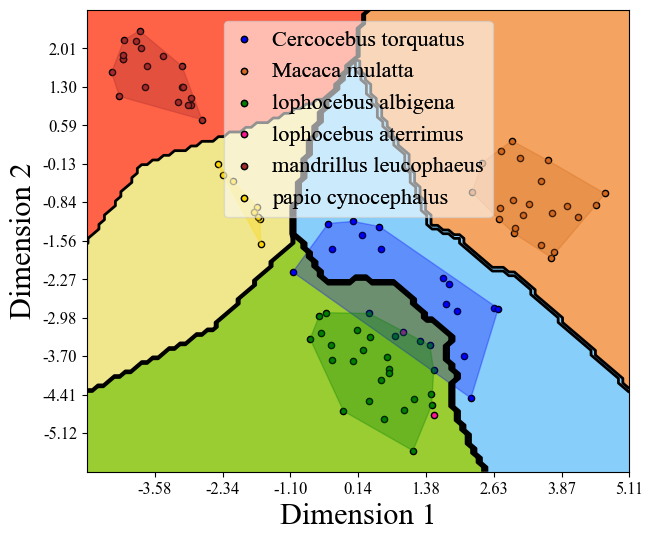

In [34]:
prpca = procpca(df)
dataf, datag, ind, name = prpca.read('PCA_all.txt')
#prpca.post_process(deletg='corocebus torquatus')
prpca.plot_tsne(n_r=4, decision_boundary = True, method = 'lof', cv = True, dlegend = True, index_r = 0, perplexity=40, n_neighbors=6)
plt.show()

In [ ]:
# An example of reading the results and ploting the first 3 principal components
prpca = procpca(df)
dataf, datag, ind, name= prpca.read('without lophocebus albigena.txt')

papiocynocephalus61.778
1
papiocynocephalus61.778
papiocynocephalus61.735
2
papiocynocephalus61.735
papiocynocephalus61.737
3
papiocynocephalus61.737
papiocynocephalus61.768
4
papiocynocephalus61.768
papiocynocephalus61.764
5
papiocynocephalus61.764
papiocynocephalus61.762
6
papiocynocephalus61.762
papiocynocephalus61.775
7
papiocynocephalus61.775
papiocynocephalus61.742
8
papiocynocephalus61.742
mandrillusleucophaeus1959.1.2.6
9
mandrillusleucophaeus1959.1.2.6
mandrillusleucophaeus12.10.28.63
10
mandrillusleucophaeus12.10.28.63
mandrillusleucophaeus49.82
11
mandrillusleucophaeus49.82
mandrillusleucophaeus1974.225
12
mandrillusleucophaeus1974.225
mandrillusleucophaeus12.10.28.61
13
mandrillusleucophaeus12.10.28.61
mandrillusleucophaeus12.10.28.65
14
mandrillusleucophaeus12.10.28.65
mandrillusleucophaeus1974.203
15
mandrillusleucophaeus1974.203
mandrillusleucophaeus12.10.28.64
16
mandrillusleucophaeus12.10.28.64
mandrillusleucophaeus1974.201
17
mandrillusleucophaeus1974.201
mandrillusle

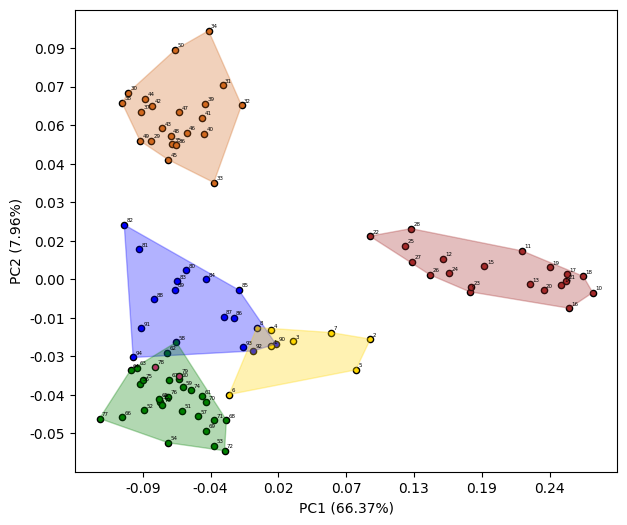

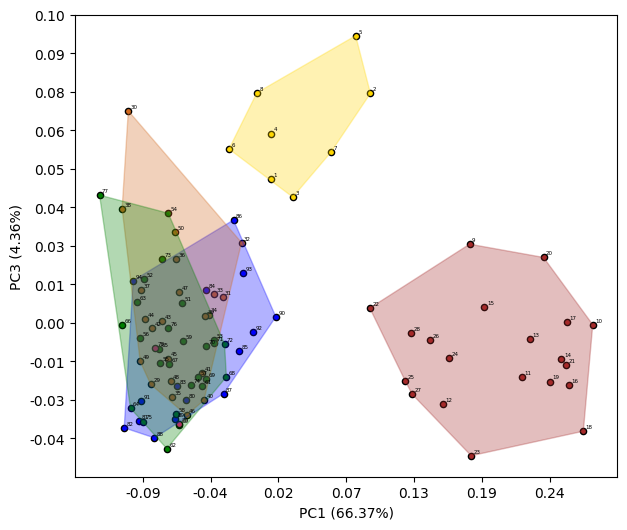

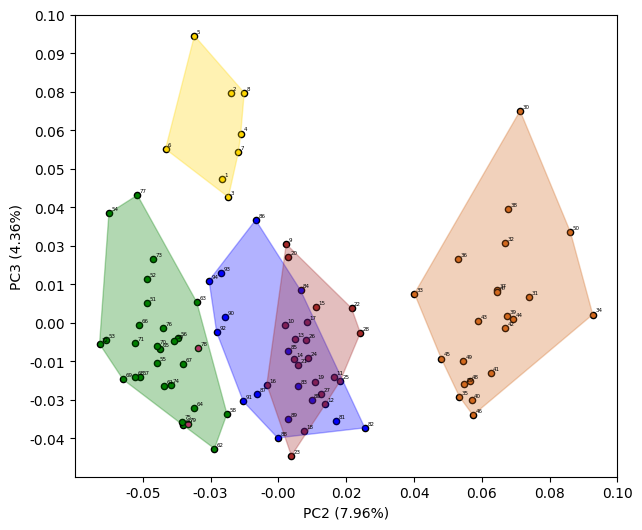

In [98]:
# Creating PCA plots
dataf, datag, ind, name = prpca.read('PCA_all.txt')
prpca.PCAplot(sav1 = 0, sav2 = '',
    sav3 = '.svg', annote = True, index_r = 0)
    
plt.show()

In [37]:
# An example of reading the results and ploting the first 3 principal components
prpca1 = procpca(df)
dataf, datag, ind, name= prpca1.read('cococebus_torquatus_4.txt')
prpca1.post_process(deletg='Cercocebus torquatus')
prpca2 = procpca(df)
dataf, datag, ind, name= prpca2.read('cococebus_torquatus_5.txt')
prpca2.post_process(deletg='Cercocebus torquatus')
prpca3 = procpca(df)
dataf, datag, ind, name= prpca3.read('cococebus_torquatus_4,5.txt')
prpca3.post_process(deletg='Cercocebus torquatus')

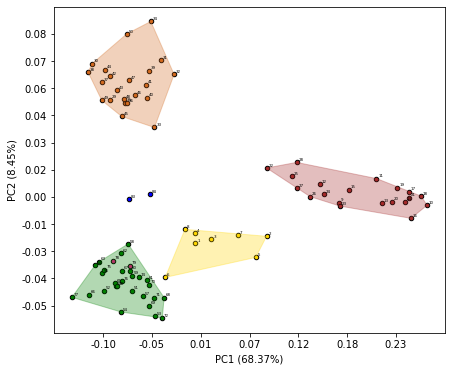

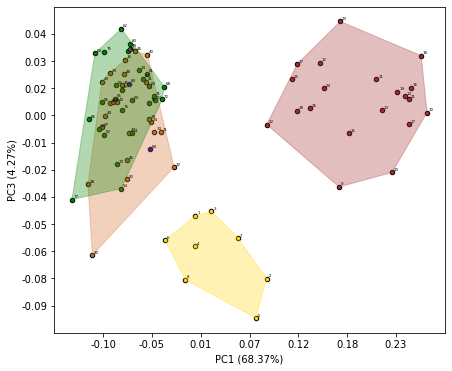

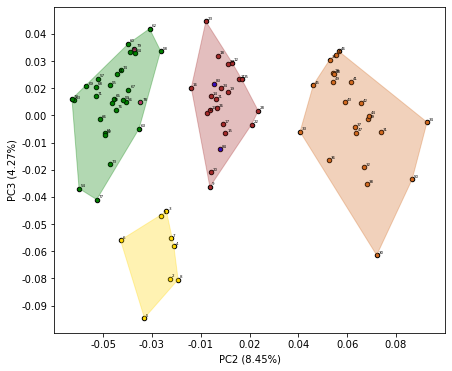

In [31]:
prpca3.PCAplot(sav1 = 0, sav2 = '',
    sav3 = '.svg', annote = True, index_r = 0)
    
plt.show()

TypeError: plot_tsne() got an unexpected keyword argument 'localo'

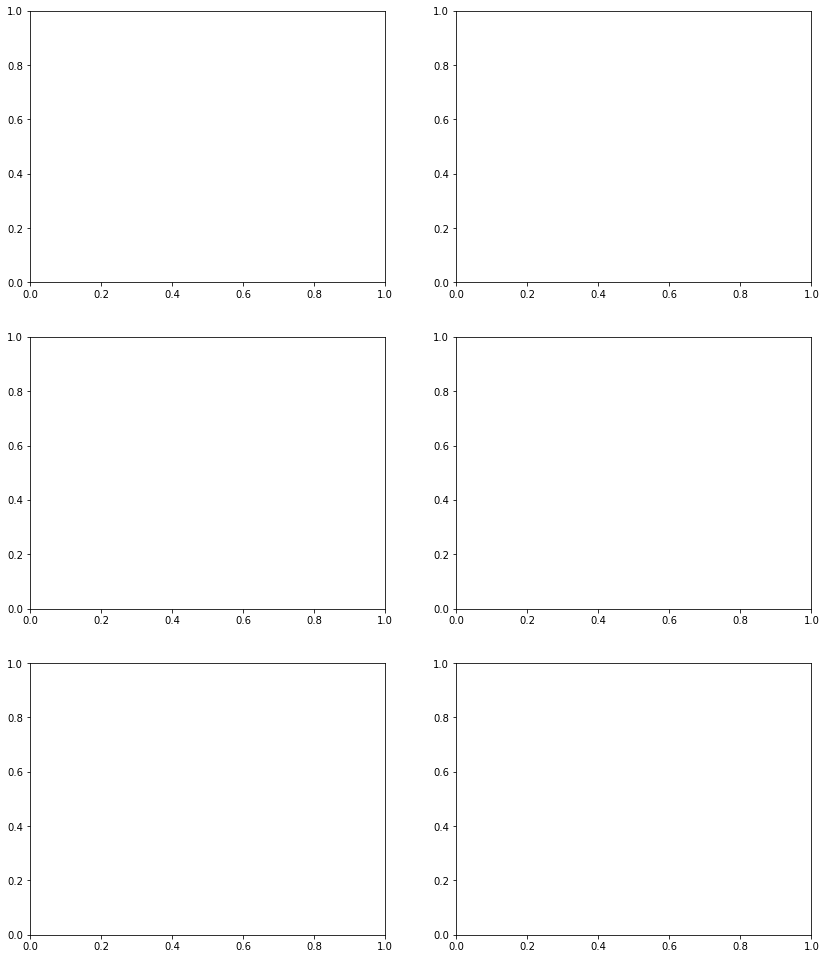

In [33]:
# Plotting the PCA and t-SNE plots together

fig, fig_axes = plt.subplots(ncols=2, nrows=3, figsize=(14,17))

prpca1.plot_tsne(localo = True, ax = fig_axes[0,0], index_r = 0, perplexity=30, n_neighbors=5)
fig_axes[0,0].set_title('A.', fontsize = 12, loc = 'left')
prpca2.plot_tsne(localo = True, ax = fig_axes[1,0], index_r = 0, perplexity=30, n_neighbors=5)
fig_axes[1,0].set_title('B.', fontsize = 12, loc = 'left')
prpca3.plot_tsne(localo = True, ax = fig_axes[2,0], index_r = 0, perplexity=30, n_neighbors=5)
fig_axes[2,0].set_title('C.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores1, bw_adjust= 0.8, ax = fig_axes[0,1])
fig_axes[0,1].scatter(X_scores1[-1], 1, c='r')
fig_axes[0,1].set_xlabel('score')
fig_axes[0,1].set_ylabel('density')
fig_axes[0,1].set_title('D.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores2, bw_adjust= 0.8, ax = fig_axes[1,1])
fig_axes[1,1].scatter(X_scores2[-1], 1, c='r')
fig_axes[1,1].set_xlabel('score')
fig_axes[1,1].set_ylabel('density')
fig_axes[1,1].set_title('D.', fontsize = 12, loc = 'left')
sns.kdeplot(X_scores3, bw_adjust= 0.8, ax = fig_axes[2,1])
fig_axes[2,1].scatter(X_scores3[-2:], [1,1], c='r')
fig_axes[2,1].set_xlabel('score')
fig_axes[2,1].set_ylabel('density')
fig_axes[2,1].set_title('D.', fontsize = 12, loc = 'left')

plt.savefig('cococebus_torquatus_4.svg', transparent = True)
plt.show()

c:\Users\edria\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


AttributeError: 'str' object has no attribute 'fit_predict'

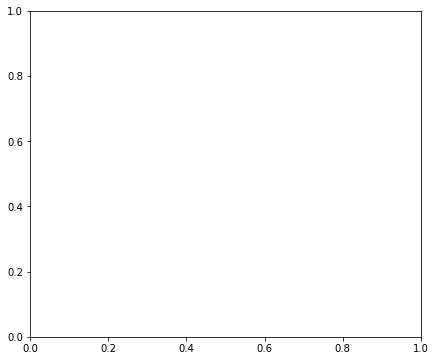

In [36]:
# Local outlier factor t-SNE plot
prpca.plot_tsne(method = 'localo', index_r = 0, perplexity=30, n_neighbors=5)
    
plt.show()

In [33]:
prpca.y

array([5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 0, 0])

In [12]:
Xs1 = prpca1.GPApt
y1 = prpca1.y
Xs2 = prpca2.GPApt
y2 = prpca2.y
Xs3 = prpca3.GPApt
y3 = prpca3.y

In [13]:
from sklearn.neighbors import LocalOutlierFactor
model = LocalOutlierFactor(n_neighbors=5, contamination=0.1)

In [14]:
y_pred1 = model.fit_predict(Xs1)
X_scores1 = model.negative_outlier_factor_
y_pred2 = model.fit_predict(Xs2)
X_scores2 = model.negative_outlier_factor_
y_pred3 = model.fit_predict(Xs3)
X_scores3 = model.negative_outlier_factor_

In [15]:
# An example of reading the results and ploting the first 3 principal components
prpca = procpca(df)
dataf, datag, ind, name= prpca.read('cococebus_torquatus_4.txt')
prpca.post_process(deletg='Cercocebus torquatus')

In [18]:
print(np.mean(X_scores),np.median(X_scores),np.std(X_scores))
print(X_scores[-1])

NameError: name 'X_scores' is not defined

In [19]:
print(X_scores1[-1])
print(X_scores2[-1])

-1.3426246363979435
-1.3595830401907327


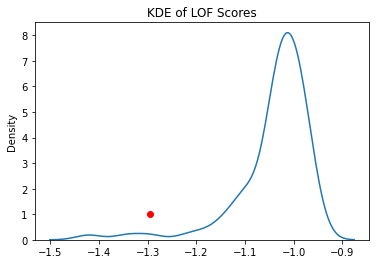

In [38]:
sns.kdeplot(X_scores, bw_adjust= 0.8)
plt.scatter(X_scores[-1], 1, c='r')
plt.title('KDE of LOF Scores')
plt.savefig('combined_plot_all.svg', transparent = True)

In [8]:
import Bio.Blast.Applications